Connected to PINN (Python 3.11.5)

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import sys
import os
wk_dir = "/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/"

ModuleNotFoundError: No module named 'cv2'

Connected to finetune (Python 3.11.5)

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import sys
import os
wk_dir = "/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/"

In [2]:
import torch
from PIL import Image
import requests
from transformers import SamModel, SamProcessor, SamImageProcessor, AutoProcessor
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry
from huggingface_hub import hf_hub_download 
from PIL import Image 
from torch import nn 
from torch.optim import AdamW 
from torch.optim.lr_scheduler import CosineAnnealingLR 
import torch.nn.functional as F 
from torchvision.transforms.functional import resize, to_pil_image 
from typing import Tuple 
device = "cuda:1" if torch.cuda.is_available() else "cpu" 

/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/miniconda3/envs/finetune/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


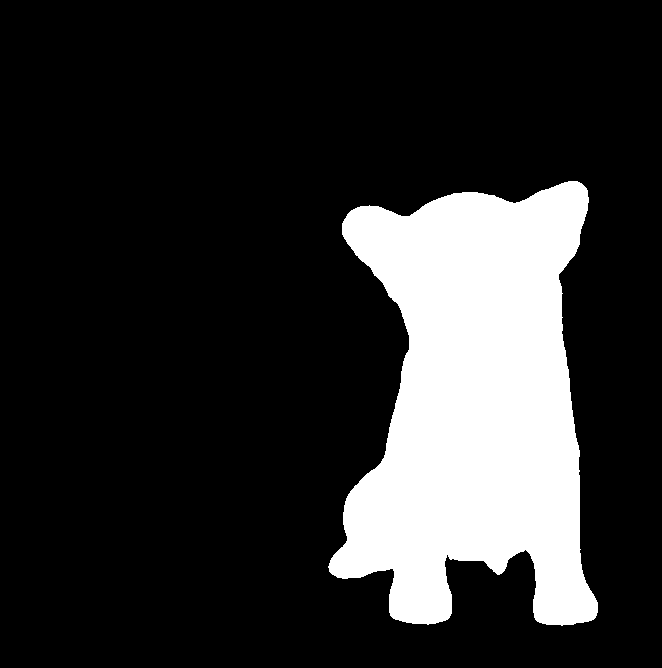

In [3]:
processor = AutoProcessor.from_pretrained("facebook/sam-vit-huge") 
model = SamModel.from_pretrained("facebook/sam-vit-huge")

# Load reference images
filename = hf_hub_download(repo_id="nielsr/persam-dog", filename="dog.jpg", repo_type="dataset") 
ref_image = Image.open(filename).convert("RGB") 
#ref_image
# Load reference mask
filename = hf_hub_download(repo_id="nielsr/persam-dog", filename="dog_mask.png", repo_type="dataset") 
# Image.open(filename).convert("RGB") mask
ref_mask = cv2.imread(filename) 
ref_mask = cv2.cvtColor(ref_mask, cv2.COLOR_BGR2RGB) 
gt_mask = torch.tensor(ref_mask)[:, :, 0] > 0 
gt_mask = gt_mask.float().unsqueeze(0).flatten(1) 
# Look at the reference mask
visual_mask = ref_mask.astype(np.uint8) 
Image.fromarray(visual_mask)

In [4]:
ref_mask

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [5]:
model.to(device) # Step 1: Image features encoding 
inputs = processor(images=ref_image, return_tensors="pt").to(device) 
pixel_values = inputs.pixel_values 
with torch.no_grad(): 
    # Forward run of reference image through SAM vision encoder
    image_embeddings = model.get_image_embeddings(pixel_values)
    ref_feat = image_embeddings.squeeze().permute(1, 2, 0)

def get_preprocess_shape(oldh: int, oldw: int, long_side_length: int) -> Tuple[int, int]: 
    """ Compute the output size given input size and target long side length. """ 
    scale = long_side_length * 1.0 / max(oldh, oldw) 
    newh, neww = oldh * scale, oldw * scale 
    neww = int(neww + 0.5) 
    newh = int(newh + 0.5) 
    return (newh, neww) 
def preprocess(x: torch.Tensor, pixel_mean=[123.675, 116.28, 103.53], pixel_std=[58.395, 57.12, 57.375], img_size=1024) -> torch.Tensor: 
    """Normalize pixel values and pad to a square input.""" 
    pixel_mean = torch.Tensor(pixel_mean).view(-1, 1, 1) 
    pixel_std = torch.Tensor(pixel_std).view(-1, 1, 1) # Normalize colors 
    x = (x - pixel_mean) / pixel_std # Pad 
    h, w = x.shape[-2:] 
    padh = img_size - h 
    padw = img_size - w 
    x = F.pad(x, (0, padw, 0, padh)) 
    return x 
def prepare_mask(image, target_length=1024): 
    target_size = get_preprocess_shape(image.shape[0], image.shape[1], target_length) 
    mask = np.array(resize(to_pil_image(image), target_size)) 
    input_mask = torch.as_tensor(mask) 
    input_mask = input_mask.permute(2, 0, 1).contiguous()[None, :, :, :] 
    input_mask = preprocess(input_mask) 
    return input_mask

# Step 2: interpolate reference mask 
# Reference mask is the target (0,1)
ref_mask = prepare_mask(ref_mask) 
ref_mask = F.interpolate(ref_mask, size=ref_feat.shape[0: 2], mode="bilinear") 
ref_mask = ref_mask.squeeze()[0] 
# Step 3: Target feature extraction 
target_feat = ref_feat[ref_mask > 0] 
target_feat_mean = target_feat.mean(0) 
target_feat_max = torch.max(target_feat, dim=0)[0] 
target_feat = (target_feat_max / 2 + target_feat_mean / 2).unsqueeze(0)

In [6]:
ref_mask

tensor([[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000],
        [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000],
        [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000],
        ...,
        [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000],
        [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000],
        [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179,  0.0000]])

In [7]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import sys
import os
wk_dir = "/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/"

In [8]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

In [9]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

NameError: name 'SamPredictor' is not defined

In [10]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


In [11]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

In [12]:
filepath = wk_dir + "Data/SolarPanel/Frame_001.png"
image = cv2.imread(filepath)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [13]:
image

array([[[  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1],
        ...,
        [140, 134, 140],
        [140, 133, 139],
        [143, 136, 142]],

       [[  7,   7,   7],
        [  7,   7,   7],
        [  8,   8,   8],
        ...,
        [141, 136, 143],
        [142, 135, 143],
        [143, 136, 144]],

       [[  5,   5,   5],
        [ 23,  23,  23],
        [  4,   4,   4],
        ...,
        [139, 134, 141],
        [142, 135, 143],
        [141, 134, 142]],

       ...,

       [[125, 122, 129],
        [129, 124, 131],
        [125, 122, 129],
        ...,
        [155, 152, 161],
        [157, 150, 155],
        [155, 148, 153]],

       [[123, 120, 127],
        [131, 126, 133],
        [125, 122, 129],
        ...,
        [177, 169, 167],
        [163, 151, 144],
        [145, 134, 117]],

       [[123, 120, 127],
        [133, 128, 135],
        [129, 126, 133],
        ...,
        [138, 123, 114],
        [114, 103,  93],
        [ 77,  69,  56]]

In [14]:
imshow(image)

NameError: name 'imshow' is not defined

In [15]:
cv2.imshow(image)

error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)
>  - imshow() missing required argument 'mat' (pos 2)


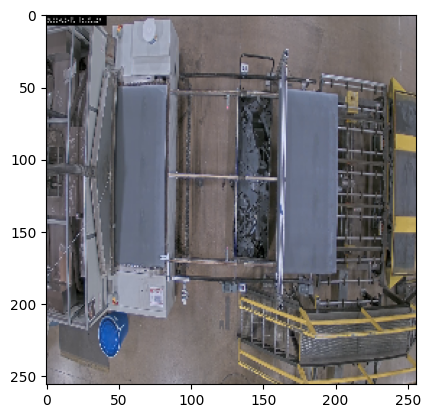

In [16]:
plt.imshow(image)

In [17]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(sam)

In [18]:
masks = mask_generator.generate(image)

In [19]:
print(len(masks))

93


NameError: name 'show_anns' is not defined

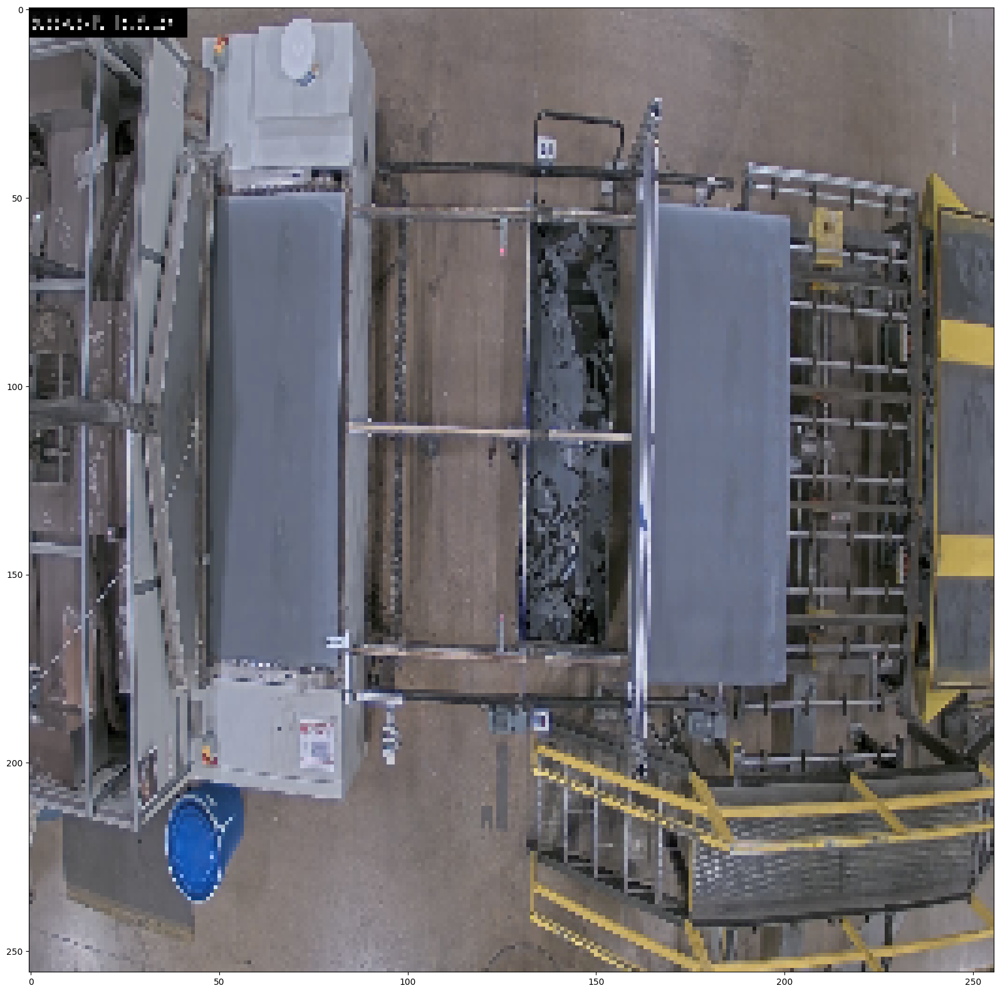

In [20]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [21]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

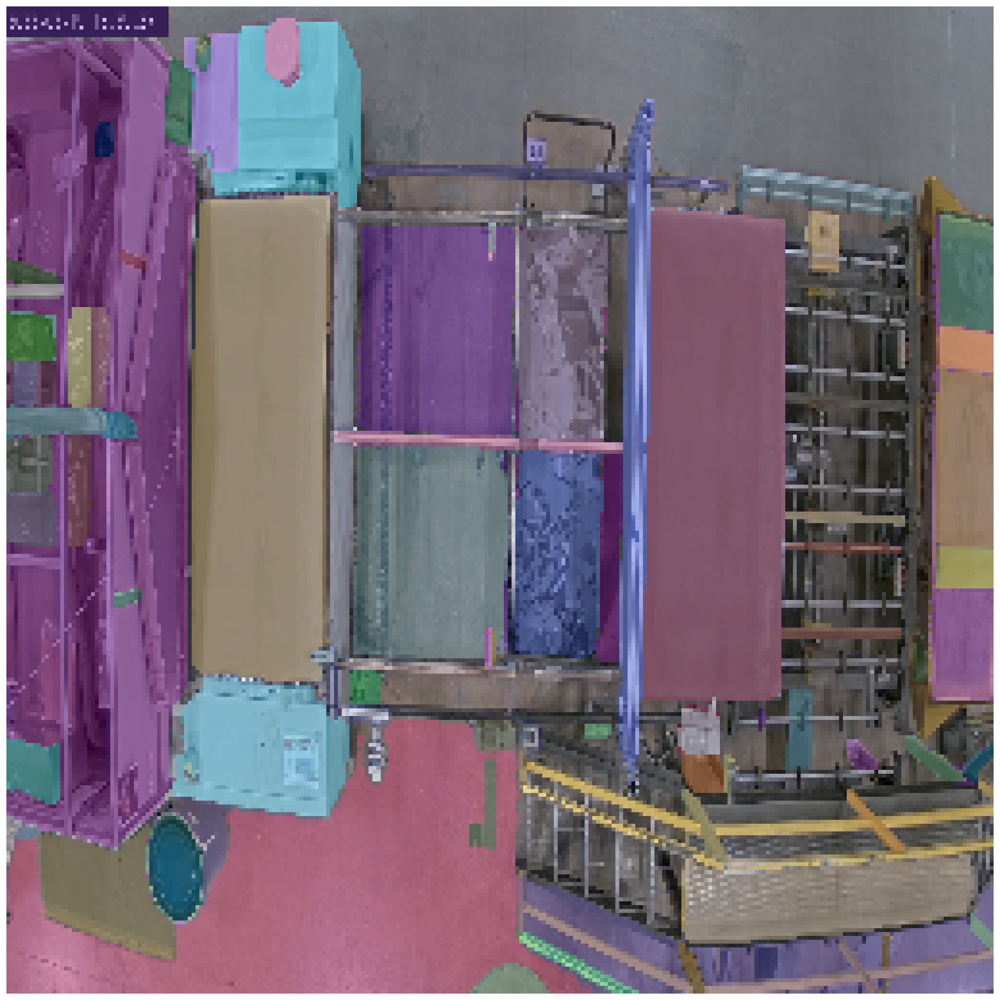

In [22]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [23]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 9372,
  'bbox': [0, 8, 48, 226],
  'predicted_iou': 1.0144327878952026,
  'point_coords': [[28.0, 92.0]],
  'stability_score': 0.9548174142837524,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 6836,
  'bbox': [42, 0, 213, 53],
  'pre

In [24]:
masks[1]

{'segmentation': array([[False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 6836,
 'bbox': [42, 0, 213, 53],
 'predicted_iou': 1.006844401359558,
 'point_coords': [[244.0, 20.0]],
 'stability_score': 0.9615986347198486,
 'crop_box': [0, 0, 256, 256]}

In [25]:
masks[2]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]]),
 'area': 5537,
 'bbox': [0, 185, 246, 70],
 'predicted_iou': 1.0020158290863037,
 'point_coords': [[4.0, 252.0]],
 'stability_score': 0.9501487016677856,
 'crop_box': [0, 0, 256, 256]}

In [26]:
masks[3]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 499,
 'bbox': [36, 206, 20, 30],
 'predicted_iou': 0.9984909296035767,
 'point_coords': [[44.0, 236.0]],
 'stability_score': 0.9940000176429749,
 'crop_box': [0, 0, 256, 256]}

TypeError: only integer scalar arrays can be converted to a scalar index

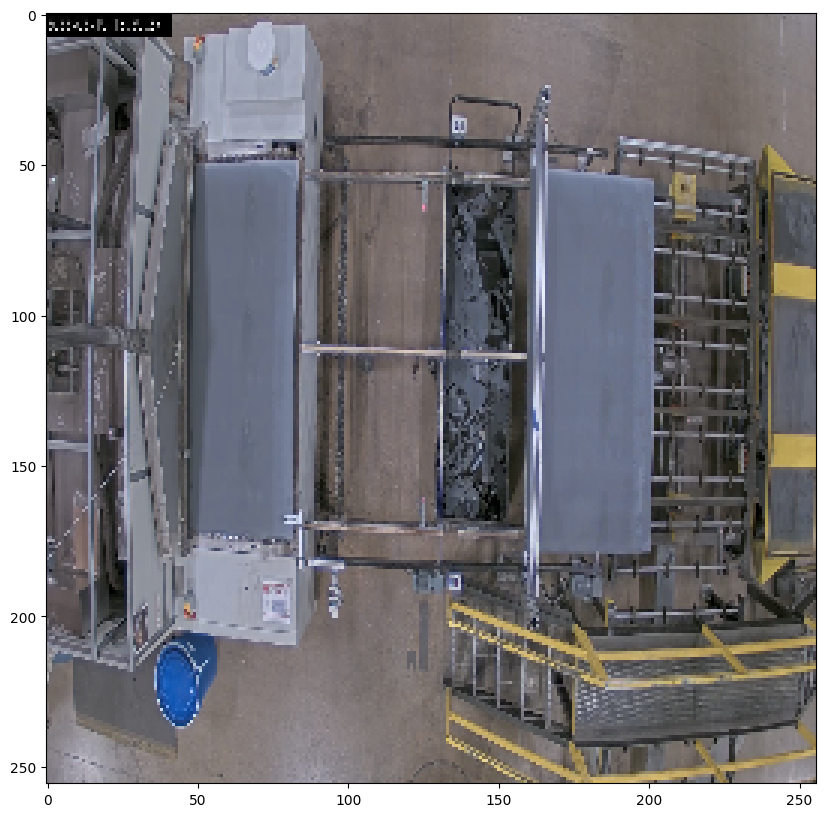

In [27]:
point1 = [[28.0, 92.0]]
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [28]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 9372,
 'bbox': [0, 8, 48, 226],
 'predicted_iou': 1.0144327878952026,
 'point_coords': [[28.0, 92.0]],
 'stability_score': 0.9548174142837524,
 'crop_box': [0, 0, 256, 256]}

TypeError: only integer scalar arrays can be converted to a scalar index

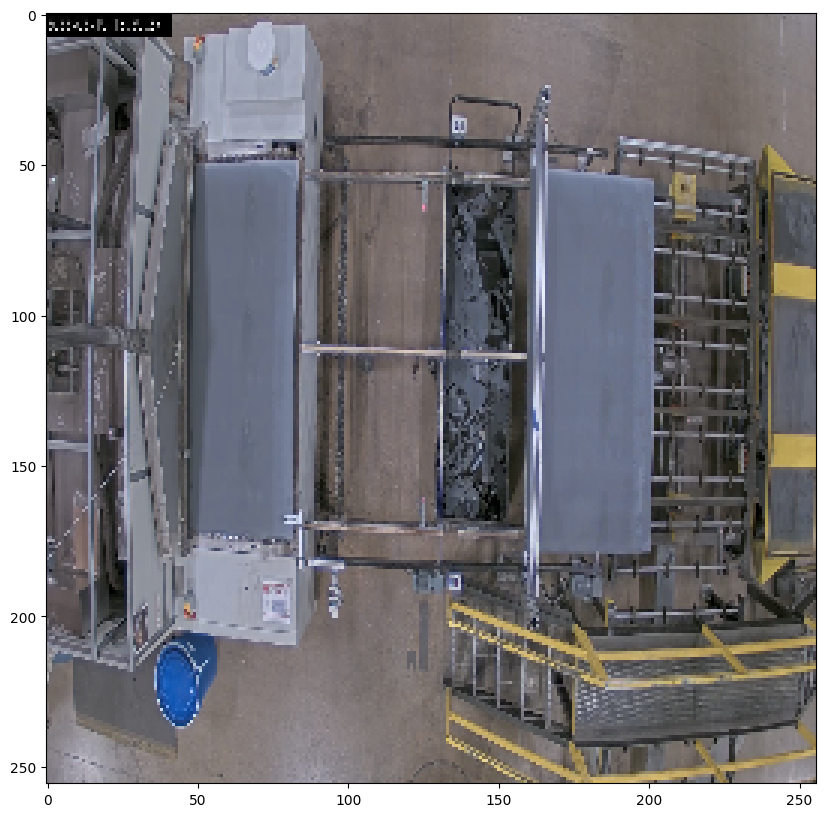

In [29]:
point1 = [[28, 92]]
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [30]:
coords = point1

In [31]:
labels = label

In [32]:
pos_points = coords[labels==1]

TypeError: only integer scalar arrays can be converted to a scalar index

In [33]:
labels == 1

array([ True])

In [34]:
coords

[[28, 92]]

In [35]:
point1[0]

[28, 92]

In [36]:
point1[label == 1]

TypeError: only integer scalar arrays can be converted to a scalar index

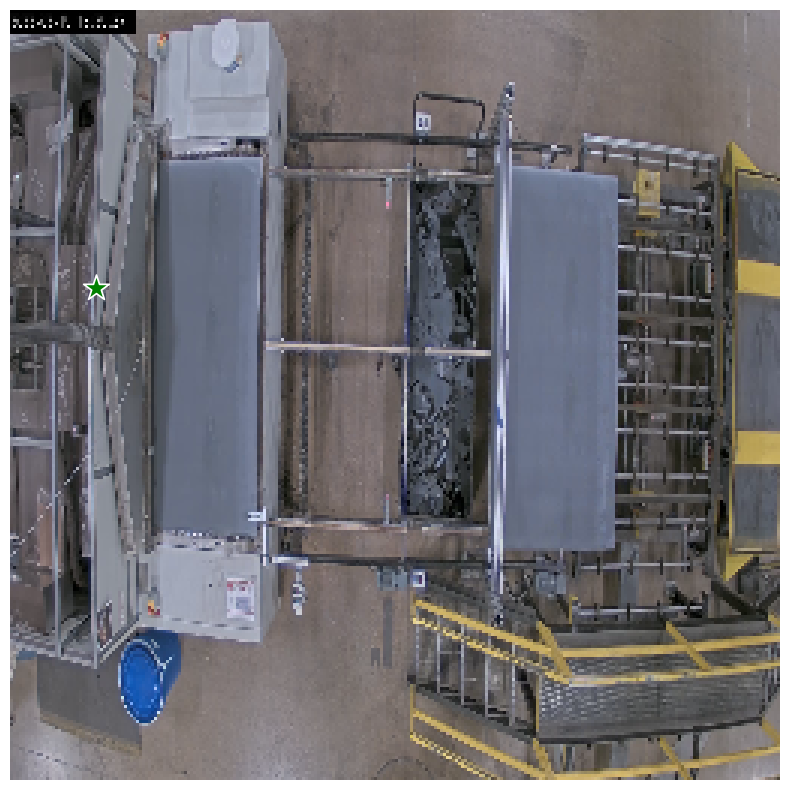

In [37]:
point1 = np.array([[28, 92]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [38]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 9372,
  'bbox': [0, 8, 48, 226],
  'predicted_iou': 1.0144327878952026,
  'point_coords': [[28.0, 92.0]],
  'stability_score': 0.9548174142837524,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 6836,
  'bbox': [42, 0, 213, 53],
  'pre

In [39]:
len(masks)

93

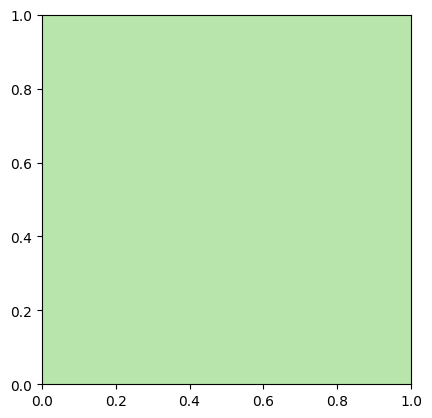

In [40]:
show_anns(masks)

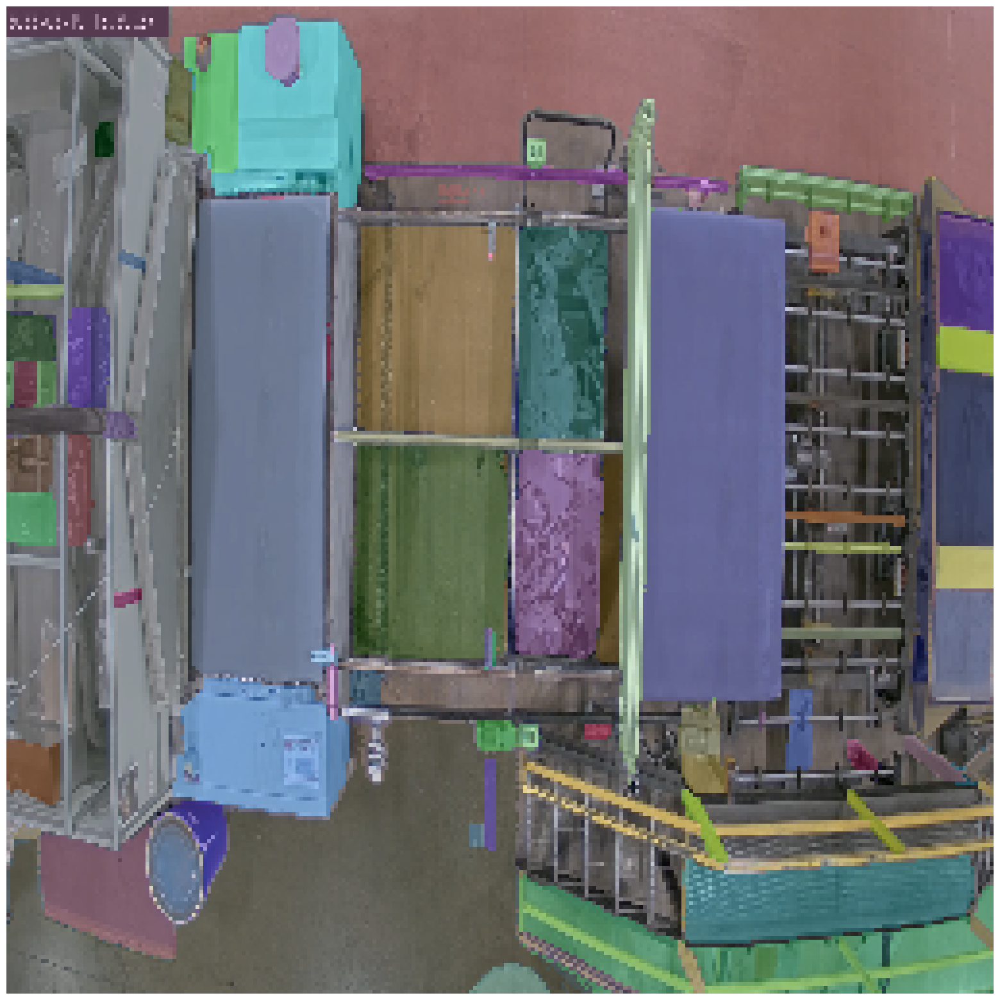

In [41]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [42]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(model = sam, min_mask_region_area=100)

In [43]:
filepath = wk_dir + "Data/SolarPanel/Frame_001.png"
image = cv2.imread(filepath)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [44]:
masks = mask_generator.generate(image)

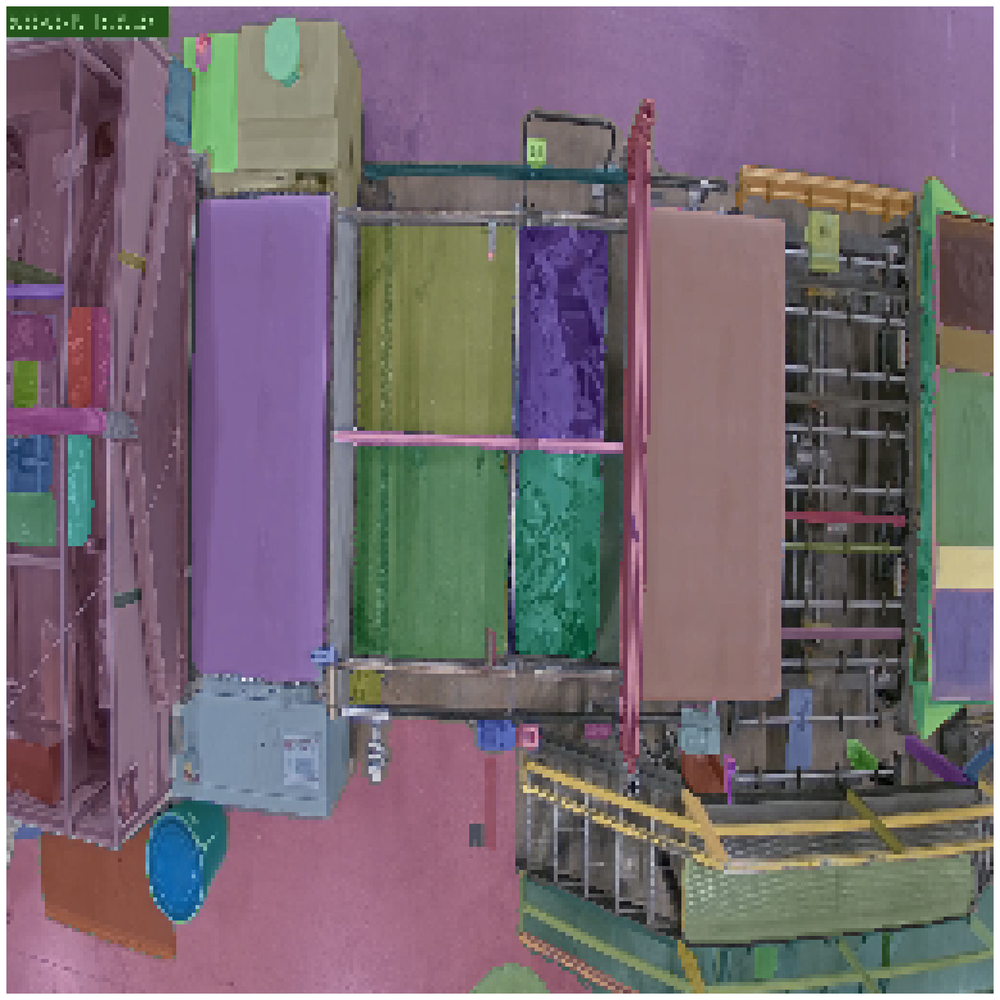

In [45]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [46]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 499,
 'bbox': [36, 206, 20, 30],
 'predicted_iou': 0.9984909296035767,
 'point_coords': [[44.0, 236.0]],
 'stability_score': 0.9940000176429749,
 'crop_box': [0, 0, 256, 256]}

In [47]:
masks[1]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4510,
 'bbox': [165, 52, 36, 127],
 'predicted_iou': 0.9984180331230164,
 'point_coords': [[172.0, 60.0]],
 'stability_score': 0.9839560389518738,
 'crop_box': [0, 0, 256, 256]}

In [48]:
masks[2]

{'segmentation': array([[ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 336,
 'bbox': [0, 0, 41, 7],
 'predicted_iou': 0.9957753419876099,
 'point_coords': [[36.0, 4.0]],
 'stability_score': 1.0,
 'crop_box': [0, 0, 256, 256]}

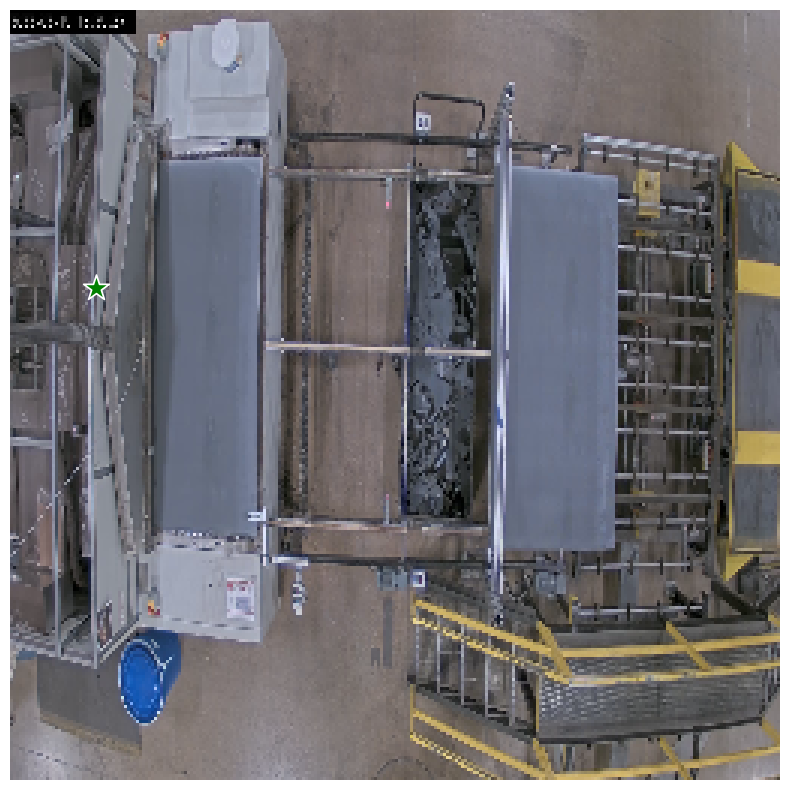

In [49]:
point1 = np.array([[28, 92]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

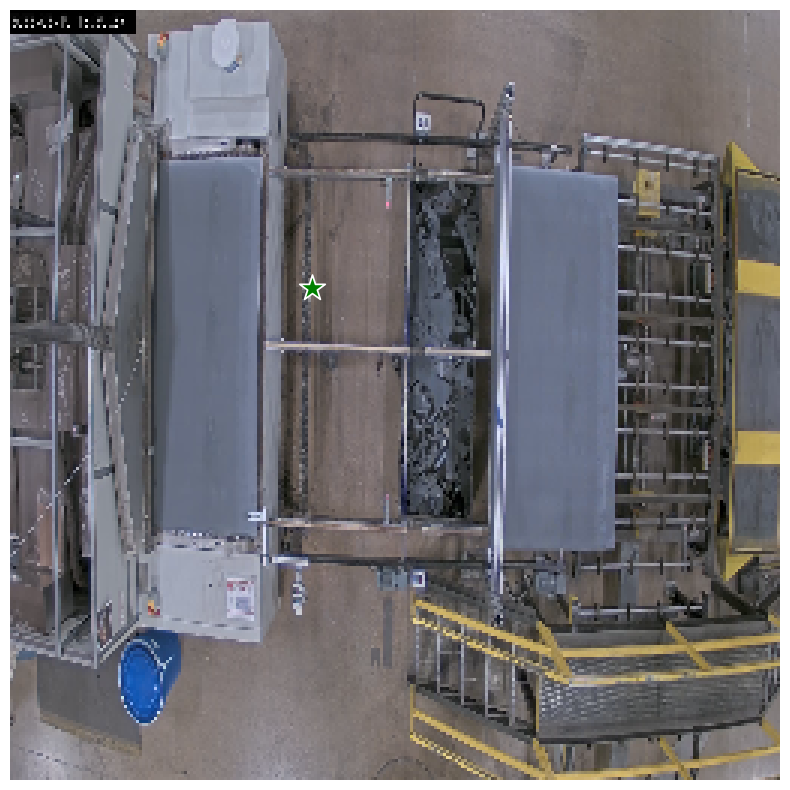

In [50]:
point1 = np.array([[100, 92]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

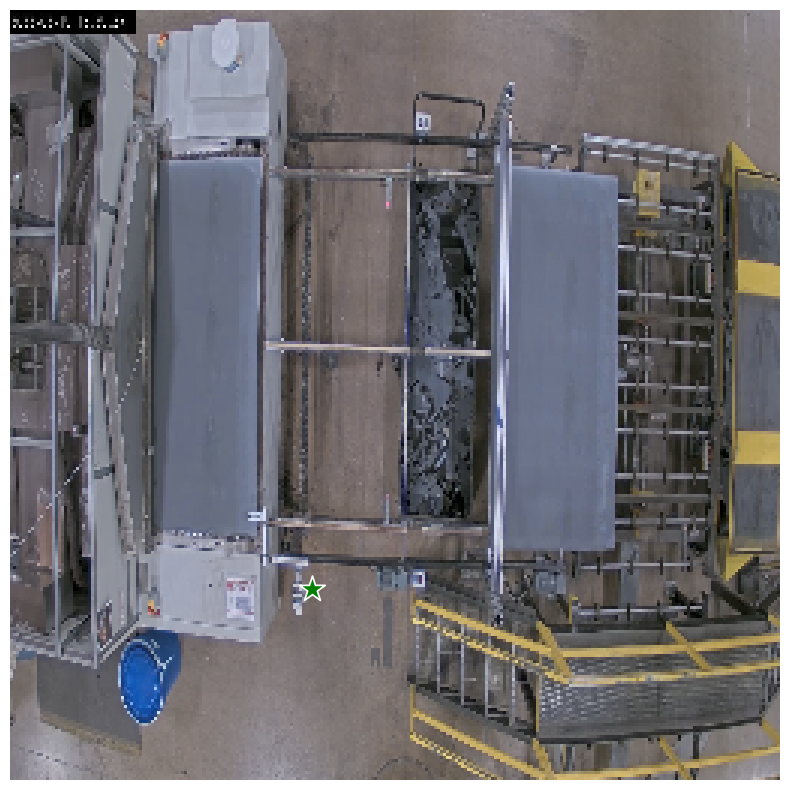

In [51]:
point1 = np.array([[100, 192]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [52]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 499,
 'bbox': [36, 206, 20, 30],
 'predicted_iou': 0.9984909296035767,
 'point_coords': [[44.0, 236.0]],
 'stability_score': 0.9940000176429749,
 'crop_box': [0, 0, 256, 256]}

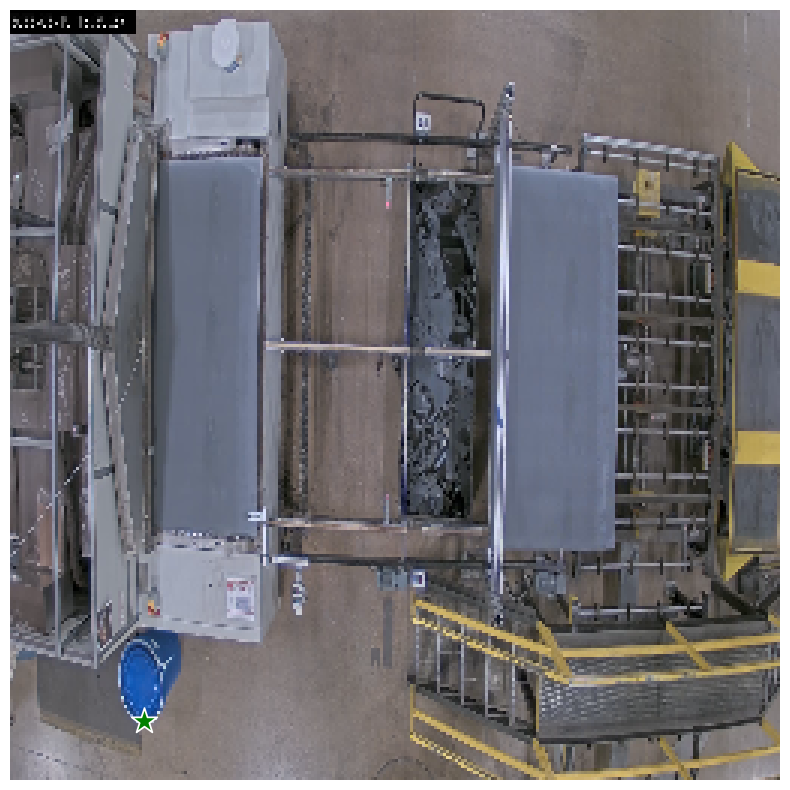

In [53]:
point1 = np.array([[44, 236]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [54]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=1000)
#SAM_assisted generating
masks = mask_generator.generate(image)

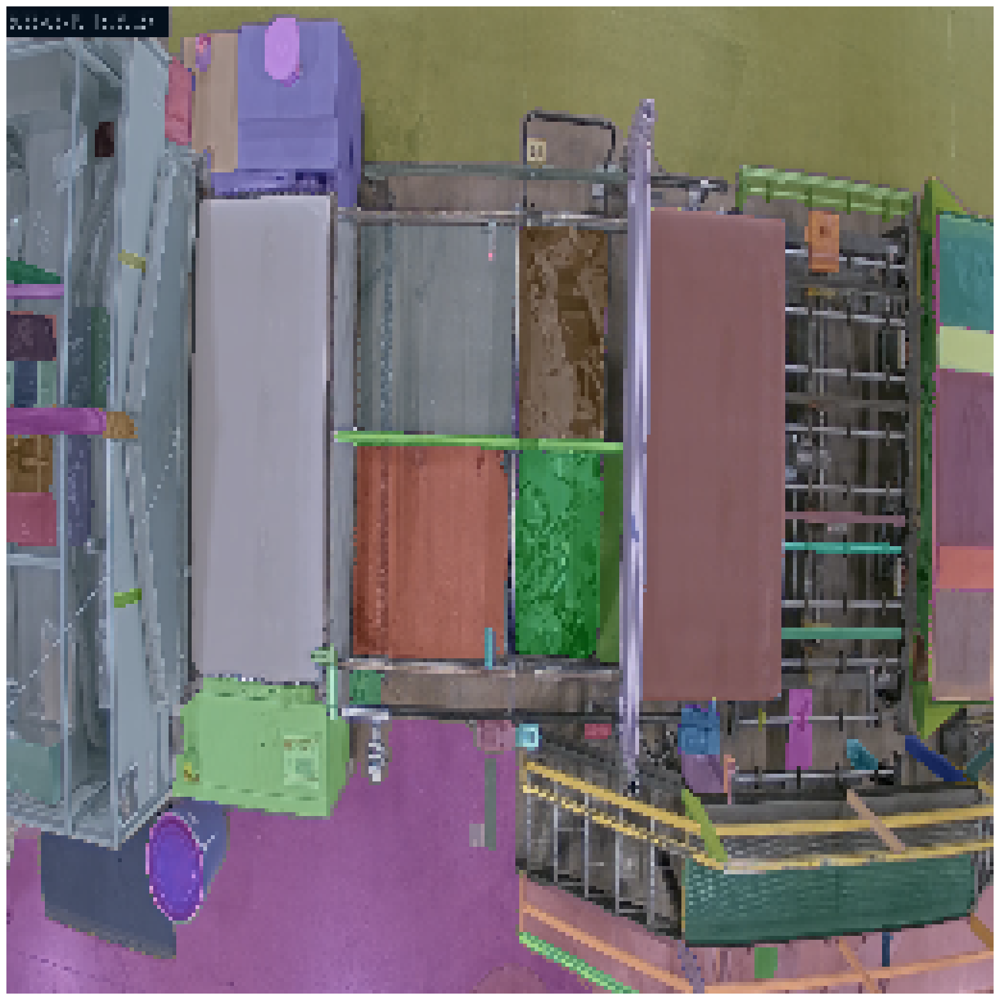

In [55]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [56]:
len(masks)

88

In [57]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=1200)
#SAM_assisted generating
masks = mask_generator.generate(image)

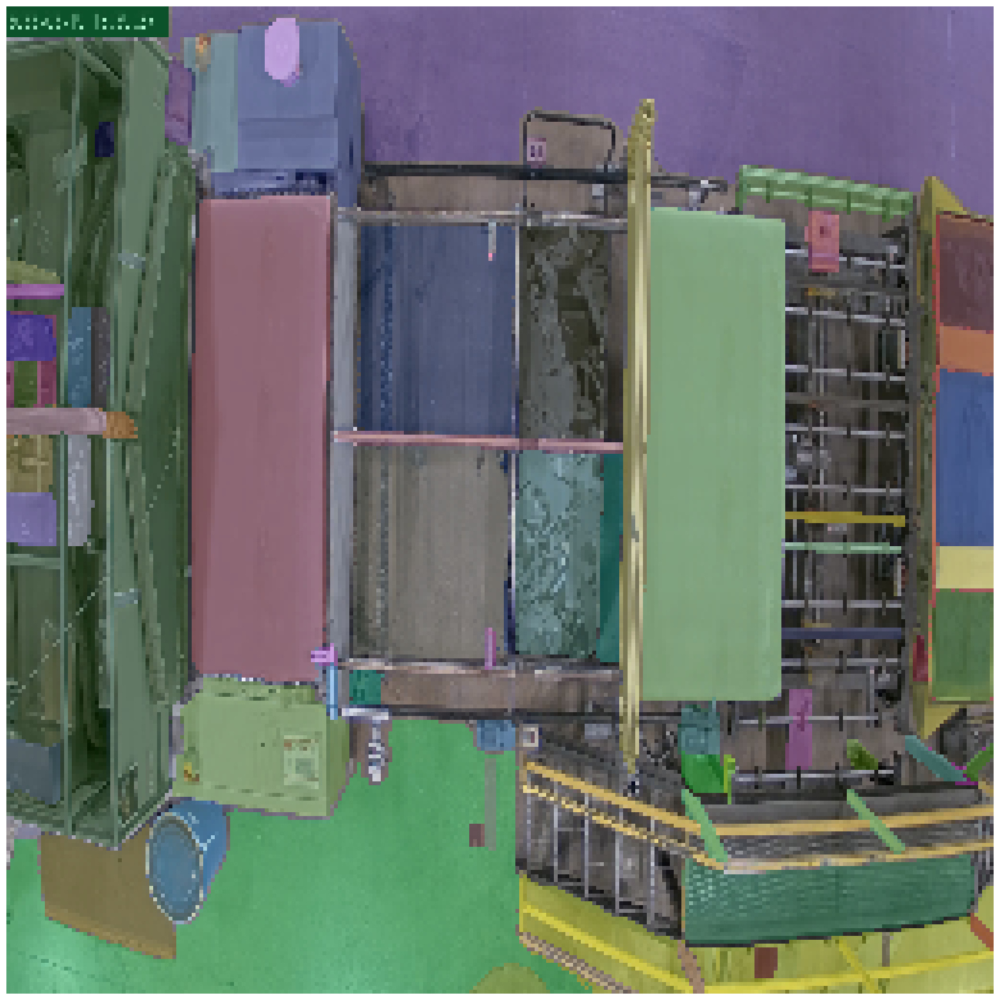

In [58]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [59]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=2000)
#SAM_assisted generating
masks = mask_generator.generate(image)

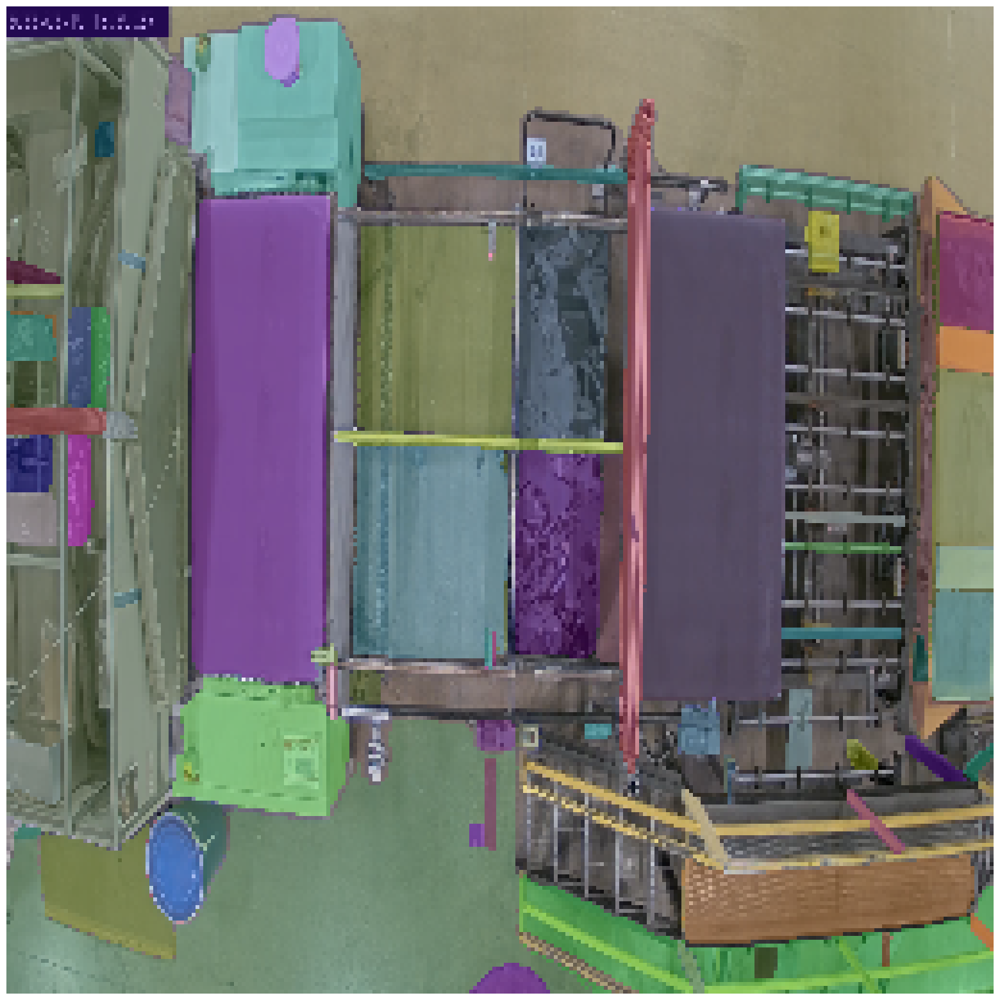

In [60]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [61]:
len(masks)

87

In [62]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=4000)
#SAM_assisted generating
masks = mask_generator.generate(image)

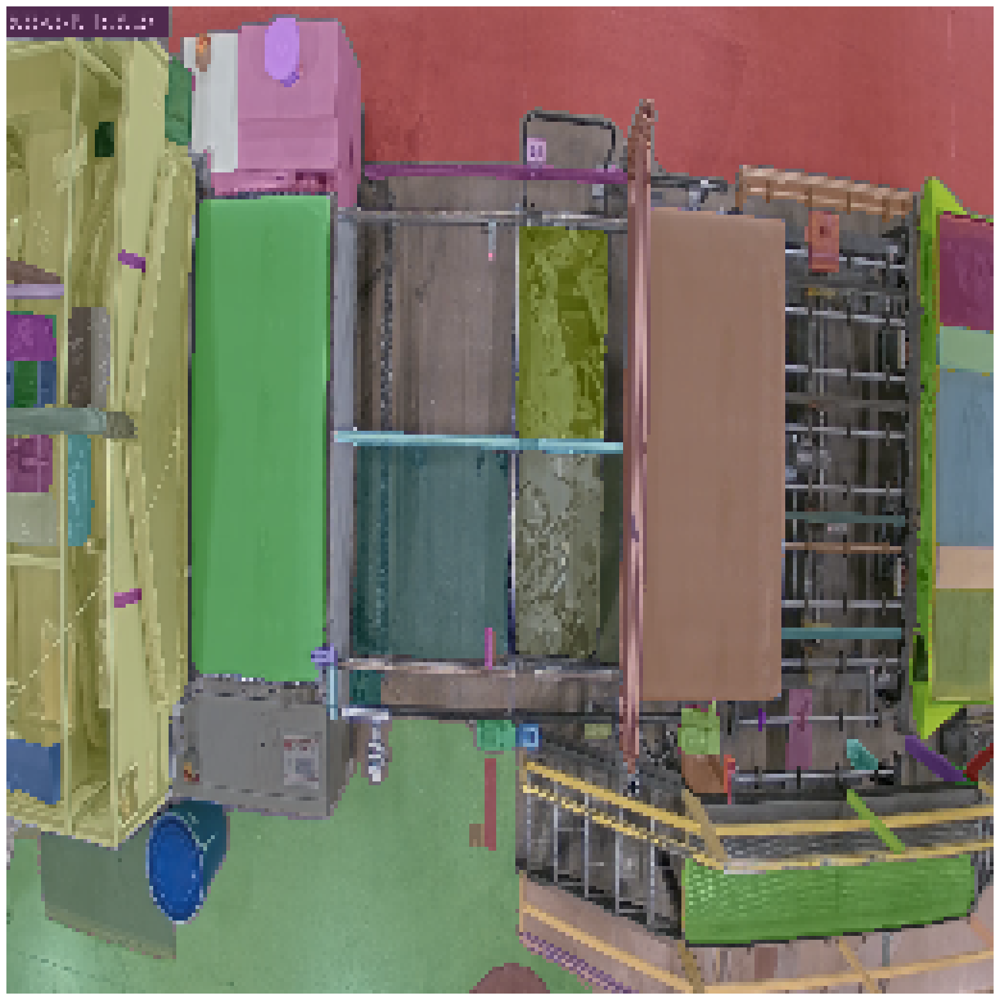

In [63]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [64]:
len(masks)

86

In [65]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4510,
 'bbox': [165, 52, 36, 127],
 'predicted_iou': 0.9984180331230164,
 'point_coords': [[172.0, 60.0]],
 'stability_score': 0.9839560389518738,
 'crop_box': [0, 0, 256, 256]}

In [66]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=6000)
#SAM_assisted generating
masks = mask_generator.generate(image)

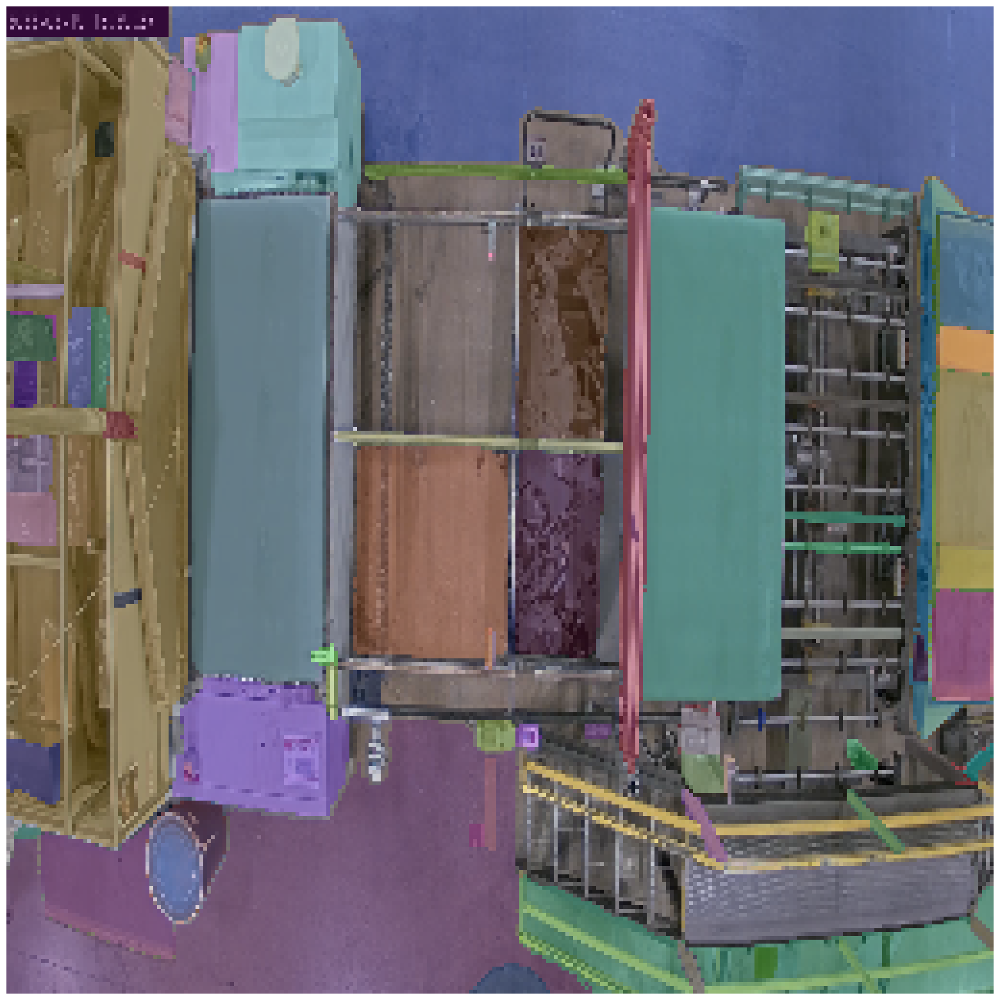

In [67]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [68]:
len(masks)

86

In [69]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 9357,
 'bbox': [0, 8, 48, 209],
 'predicted_iou': 1.0144327878952026,
 'point_coords': [[28.0, 92.0]],
 'stability_score': 0.9548174142837524,
 'crop_box': [0, 0, 256, 256]}

In [70]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=20000)
#SAM_assisted generating
masks = mask_generator.generate(image)

In [71]:
print(len(masks))

86


In [72]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=80000)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))

1


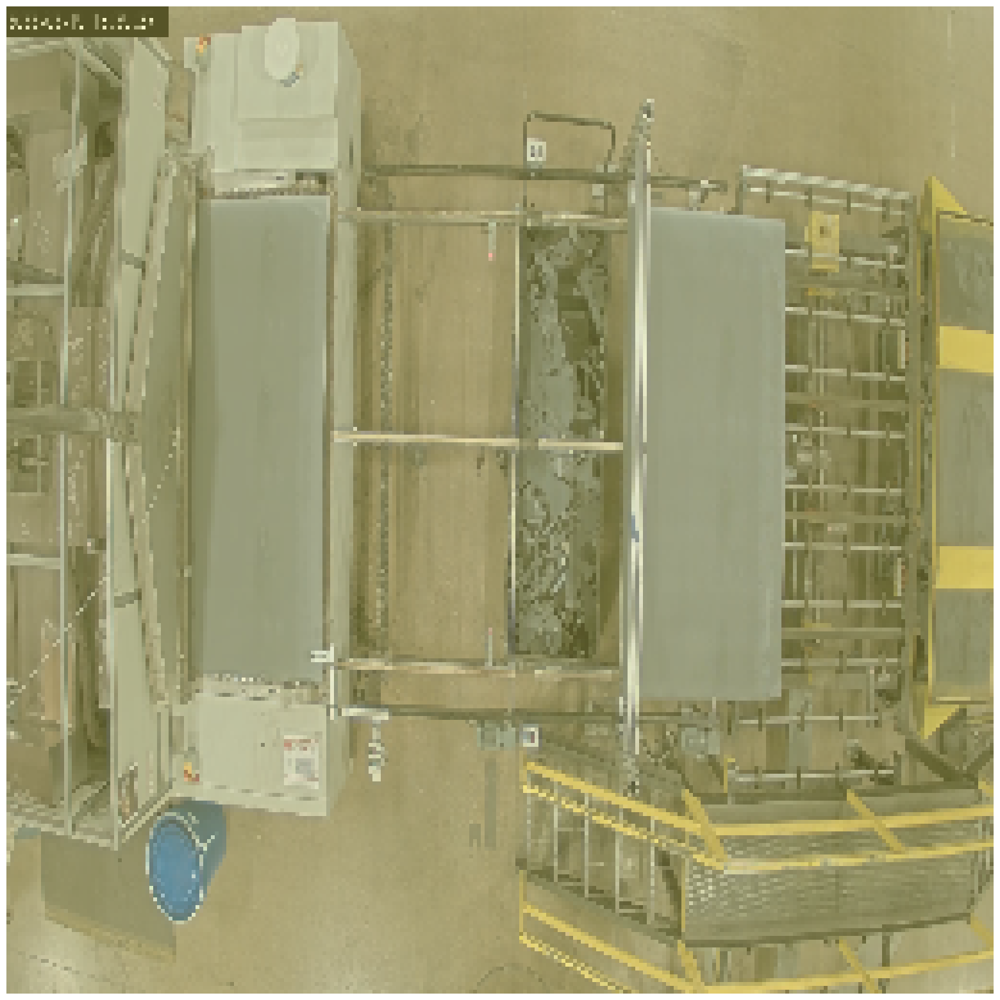

In [73]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [74]:
masks

[{'segmentation': array([[ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True]]),
  'area': 65536,
  'bbox': [0, 0, 255, 255],
  'predicted_iou': 1.0144327878952026,
  'point_coords': [[28.0, 92.0]],
  'stability_score': 0.9548174142837524,
  'crop_box': [0, 0, 256, 256]}]

In [75]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=6000,
                                           pred_iou_thresh=0.95)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))
# Area = 80000 - 1
# Total area of the image: 65536

32


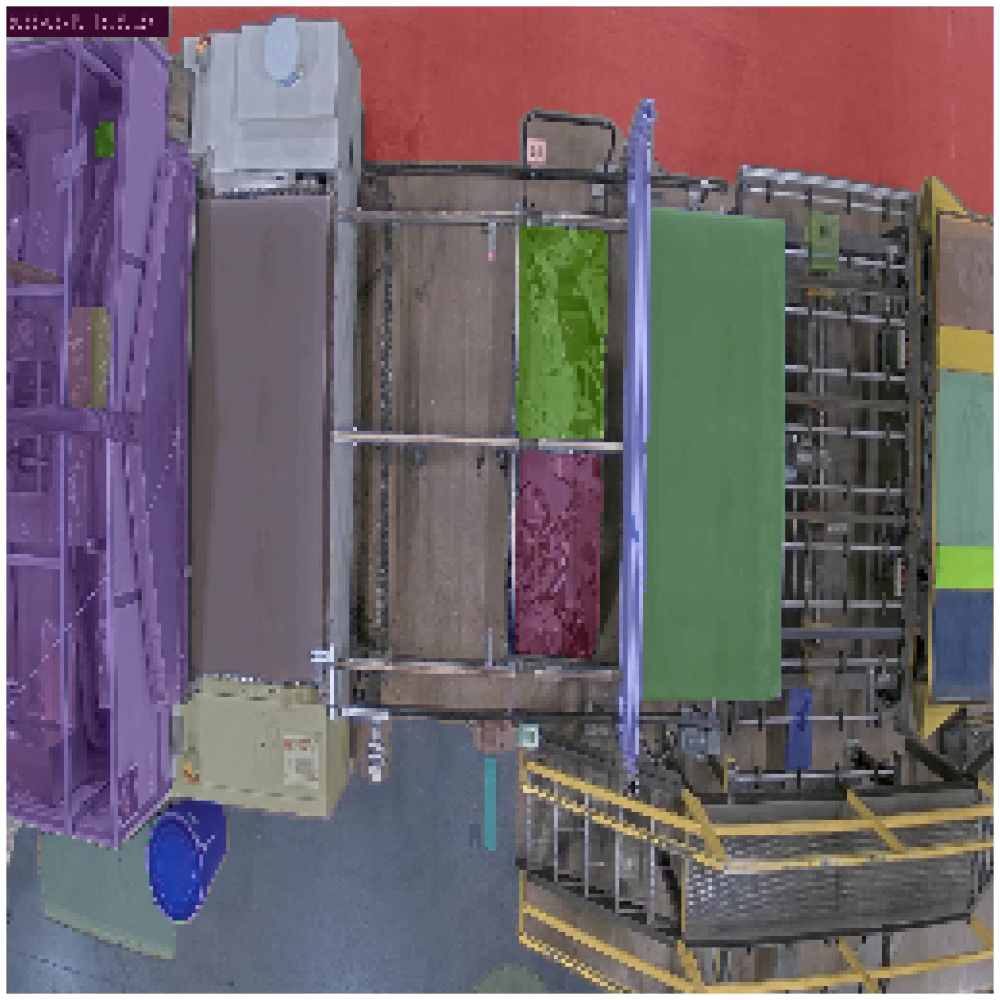

In [76]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [77]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 9357,
  'bbox': [0, 8, 48, 209],
  'predicted_iou': 1.0144327878952026,
  'point_coords': [[28.0, 92.0]],
  'stability_score': 0.9548174142837524,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 6804,
  'bbox': [42, 0, 213, 53],
  'pre

In [78]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 9357,
 'bbox': [0, 8, 48, 209],
 'predicted_iou': 1.0144327878952026,
 'point_coords': [[28.0, 92.0]],
 'stability_score': 0.9548174142837524,
 'crop_box': [0, 0, 256, 256]}

In [79]:
a = masks[0]

In [80]:
a['area']

9357

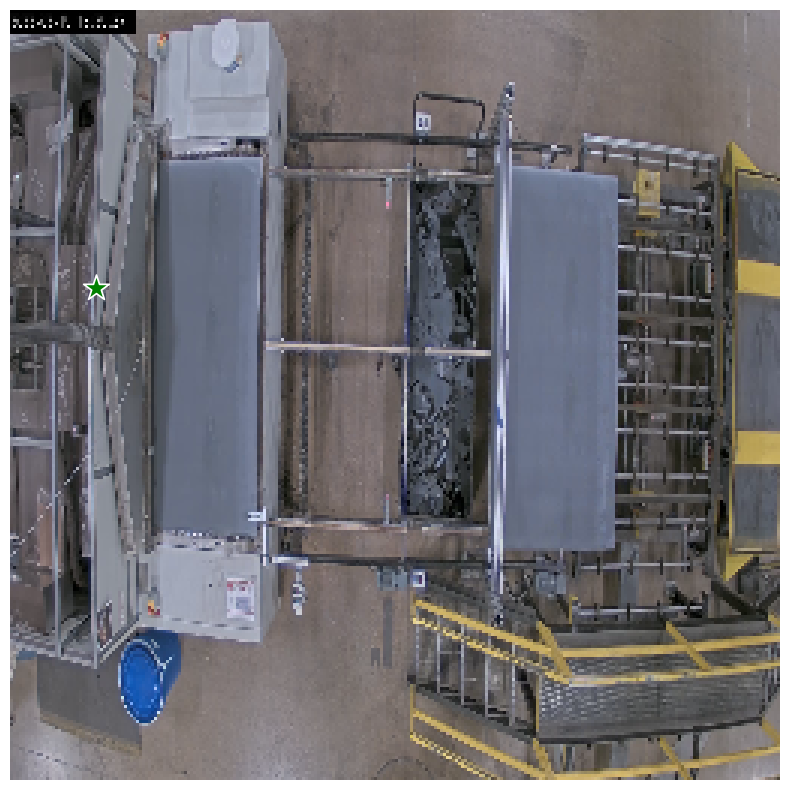

In [81]:
point1 = np.array([[28, 92]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [82]:
print(len(masks))

32


In [83]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 9357,
 'bbox': [0, 8, 48, 209],
 'predicted_iou': 1.0144327878952026,
 'point_coords': [[28.0, 92.0]],
 'stability_score': 0.9548174142837524,
 'crop_box': [0, 0, 256, 256]}

In [84]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=6000,
                                           pred_iou_thresh=1)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))
# Area = 80000 - 1
# Total area of the image: 65536

3


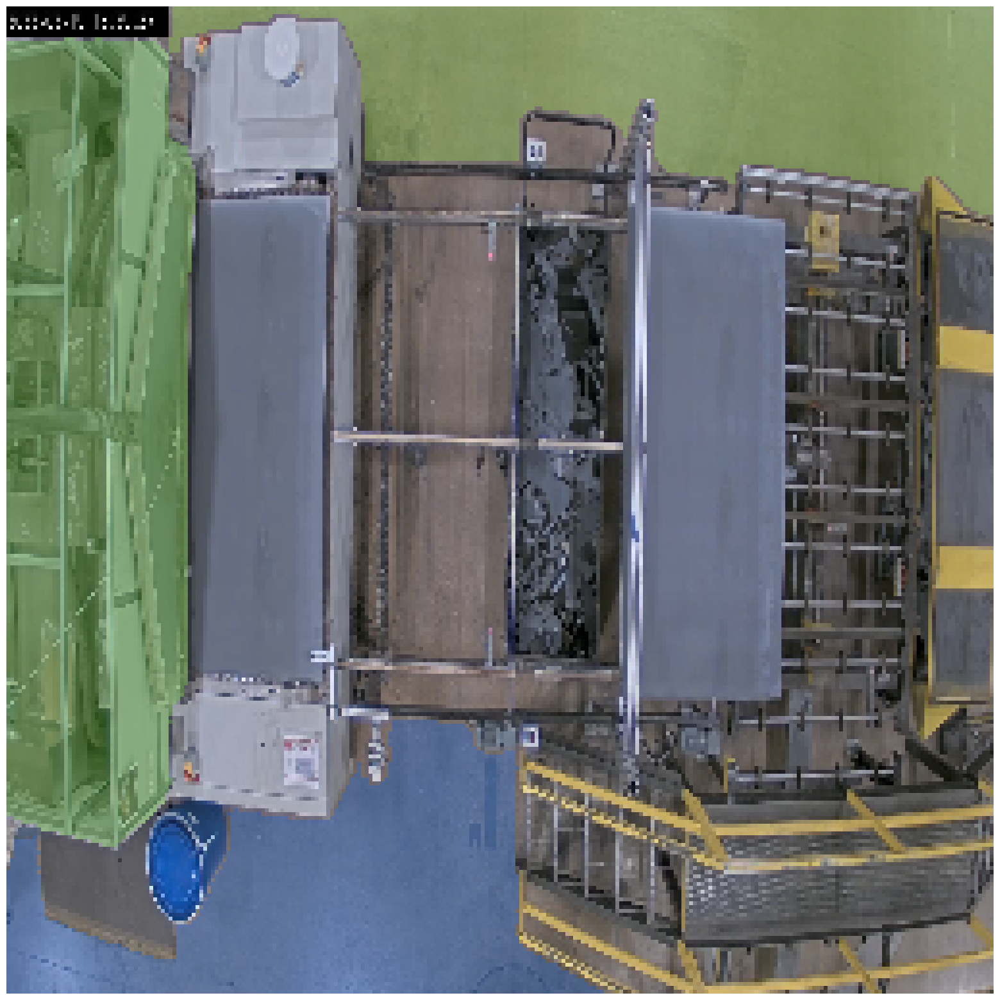

In [85]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [86]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 9357,
  'bbox': [0.0, 8.0, 48.0, 209.0],
  'predicted_iou': 1.0144327878952026,
  'point_coords': [[28.0, 92.0]],
  'stability_score': 0.9548174142837524,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 6804,
  'bbox': [42.0, 0.0, 213.

In [87]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=3000,
                                           pred_iou_thresh=1)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))
# Area = 80000 - 1
# Total area of the image: 65536

3


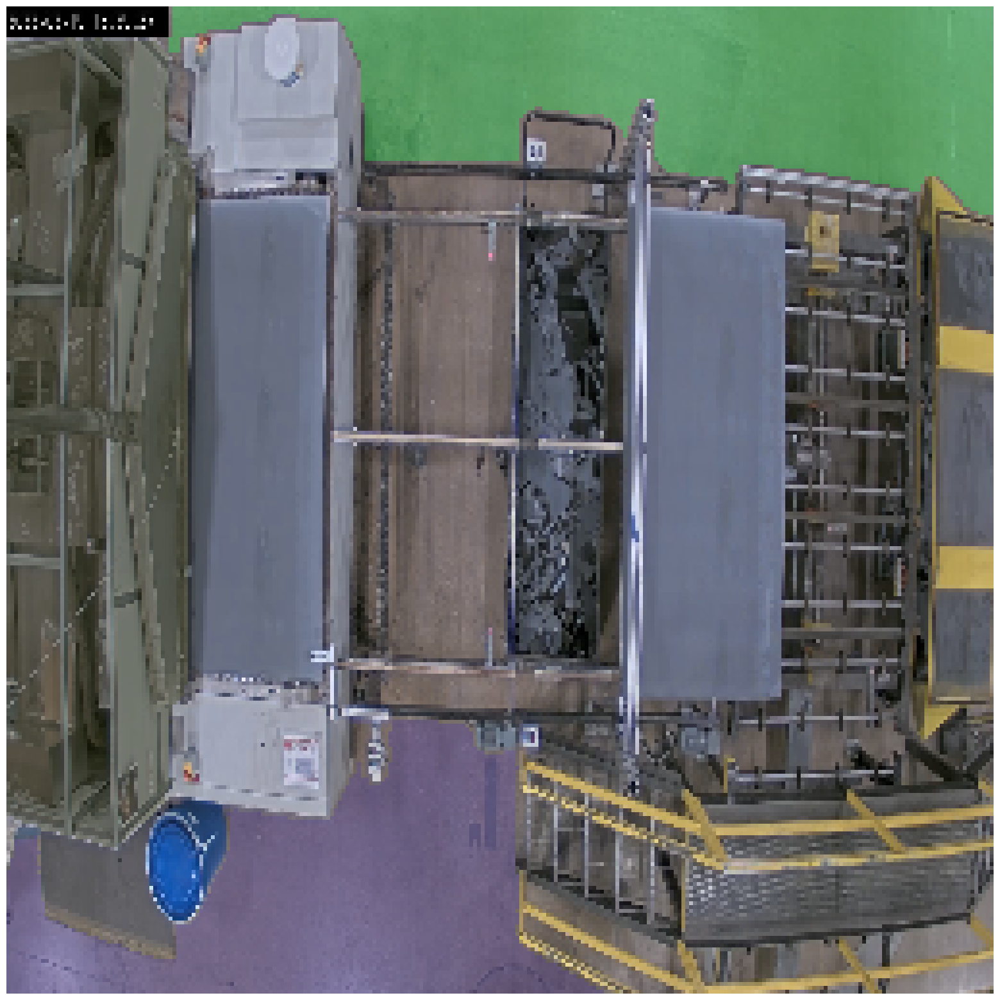

In [88]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [89]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=4000,
                                           pred_iou_thresh=0.98)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))
# Area = 80000 - 1
# Total area of the image: 65536

13


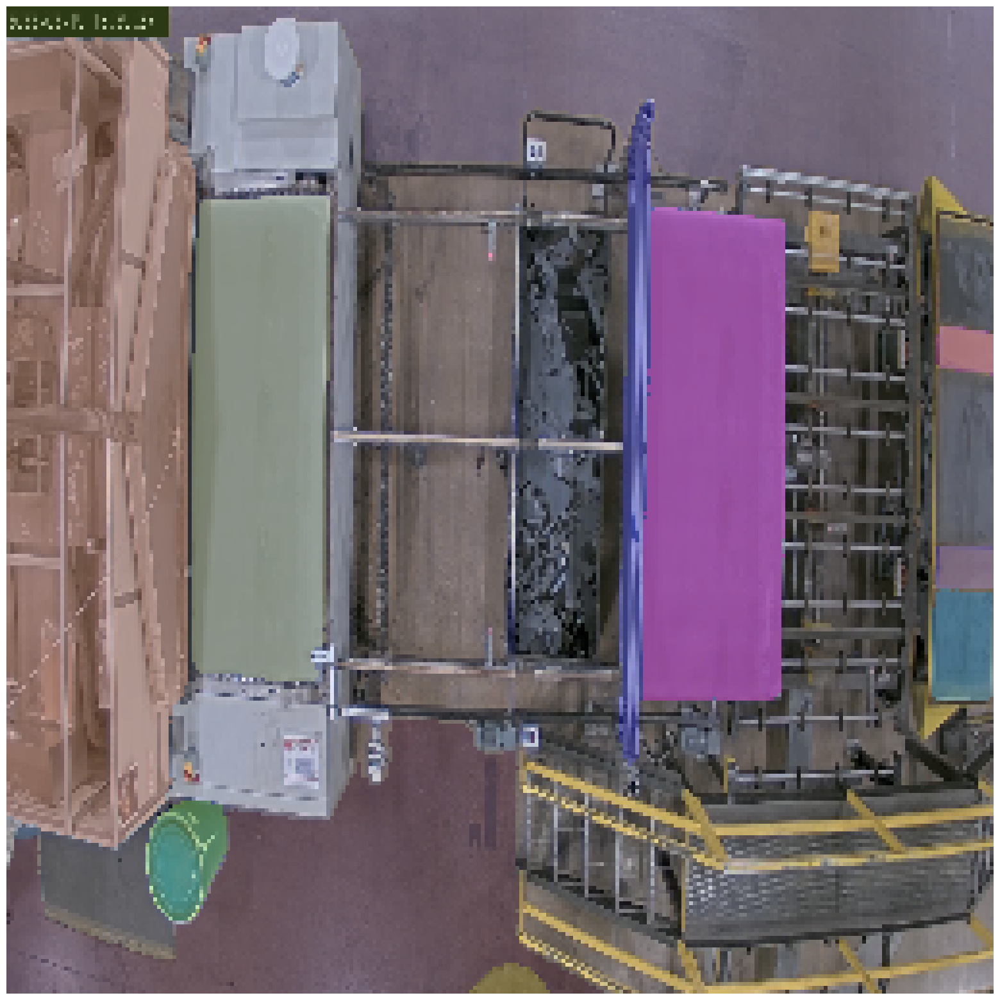

In [90]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [91]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 4510,
  'bbox': [165.0, 52.0, 36.0, 127.0],
  'predicted_iou': 0.9984180331230164,
  'point_coords': [[172.0, 60.0]],
  'stability_score': 0.9839560389518738,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 5474,
  'bbox': [159.0, 24.0

In [92]:
masks[1]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 5474,
 'bbox': [159.0, 24.0, 42.0, 172.0],
 'predicted_iou': 0.9919840097427368,
 'point_coords': [[172.0, 76.0]],
 'stability_score': 0.9898200035095215,
 'crop_box': [0, 0, 256, 256]}

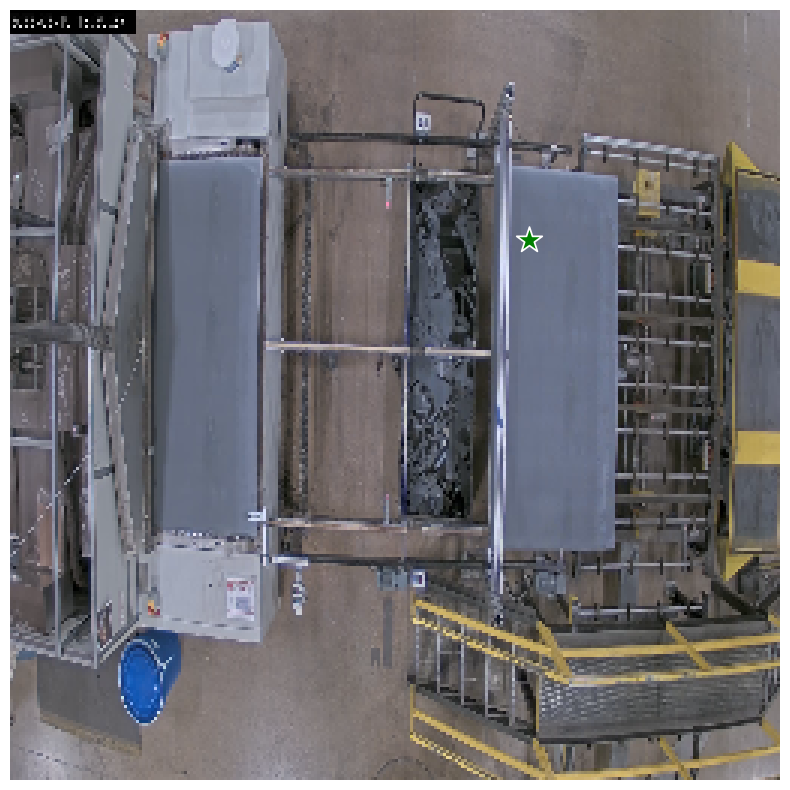

In [93]:
point1 = np.array([[172, 76]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [94]:
masks[2]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4322,
 'bbox': [48.0, 49.0, 35.0, 125.0],
 'predicted_iou': 0.9912318587303162,
 'point_coords': [[52.0, 52.0]],
 'stability_score': 0.9796198606491089,
 'crop_box': [0, 0, 256, 256]}

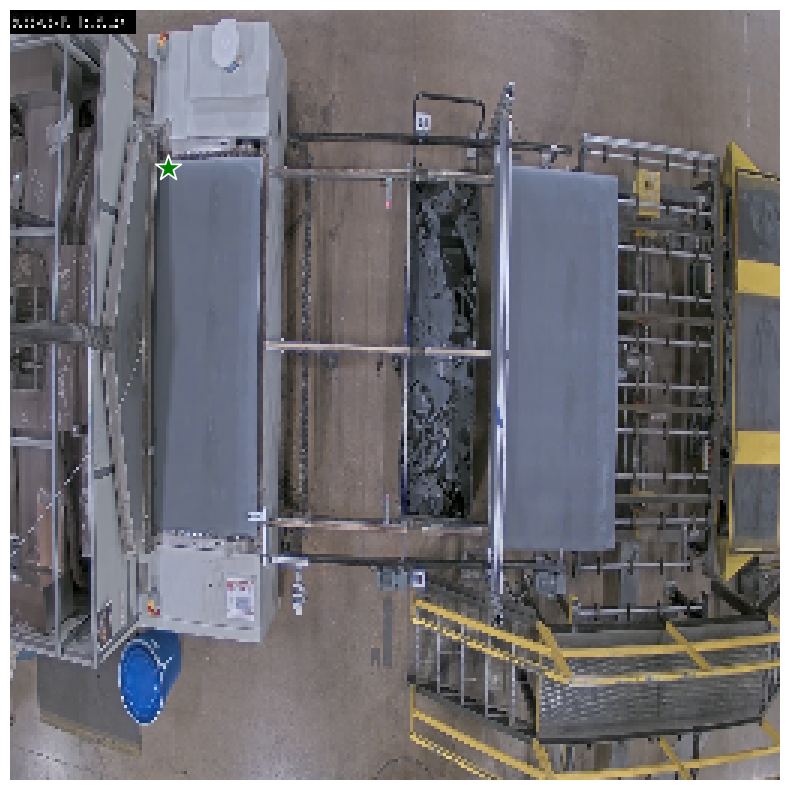

In [95]:
point1 = np.array([[52, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

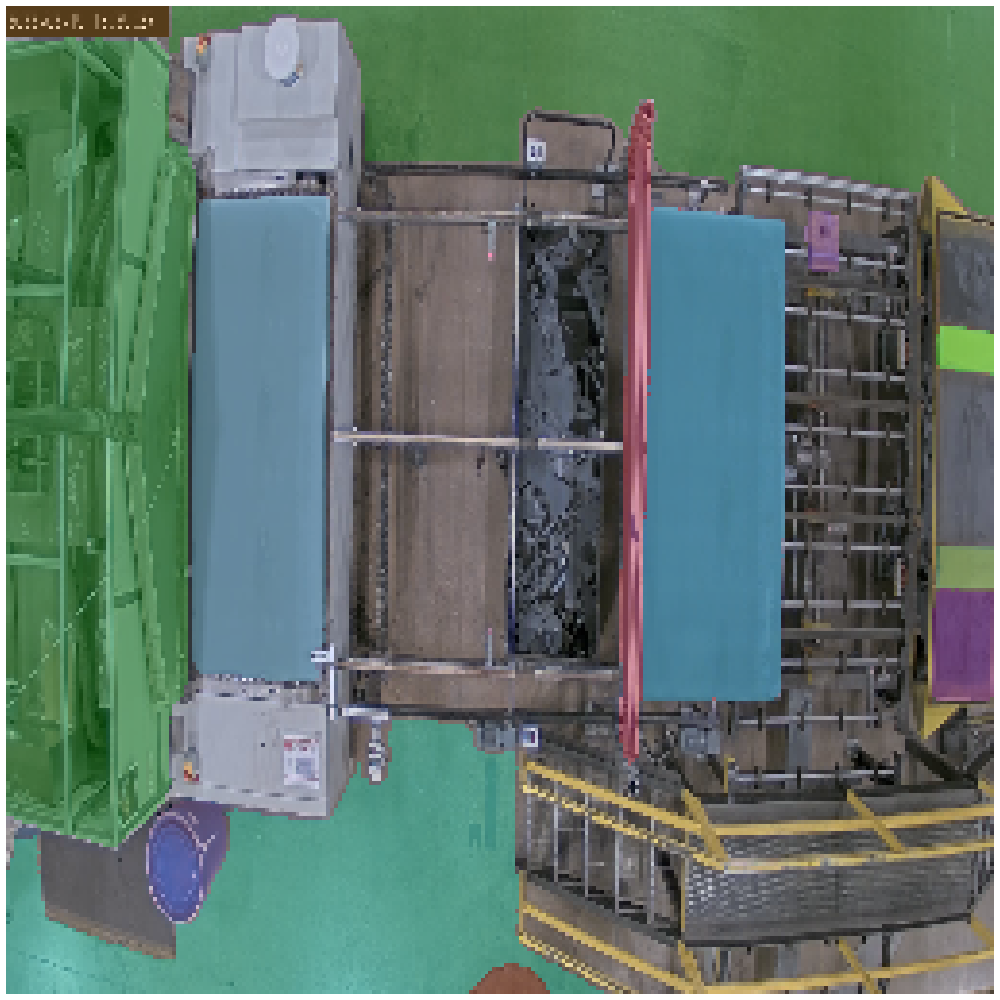

In [96]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [97]:
len(masks)

13

In [98]:
masks[2]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4322,
 'bbox': [48.0, 49.0, 35.0, 125.0],
 'predicted_iou': 0.9912318587303162,
 'point_coords': [[52.0, 52.0]],
 'stability_score': 0.9796198606491089,
 'crop_box': [0, 0, 256, 256]}

In [99]:
masks[1]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 5474,
 'bbox': [159.0, 24.0, 42.0, 172.0],
 'predicted_iou': 0.9919840097427368,
 'point_coords': [[172.0, 76.0]],
 'stability_score': 0.9898200035095215,
 'crop_box': [0, 0, 256, 256]}

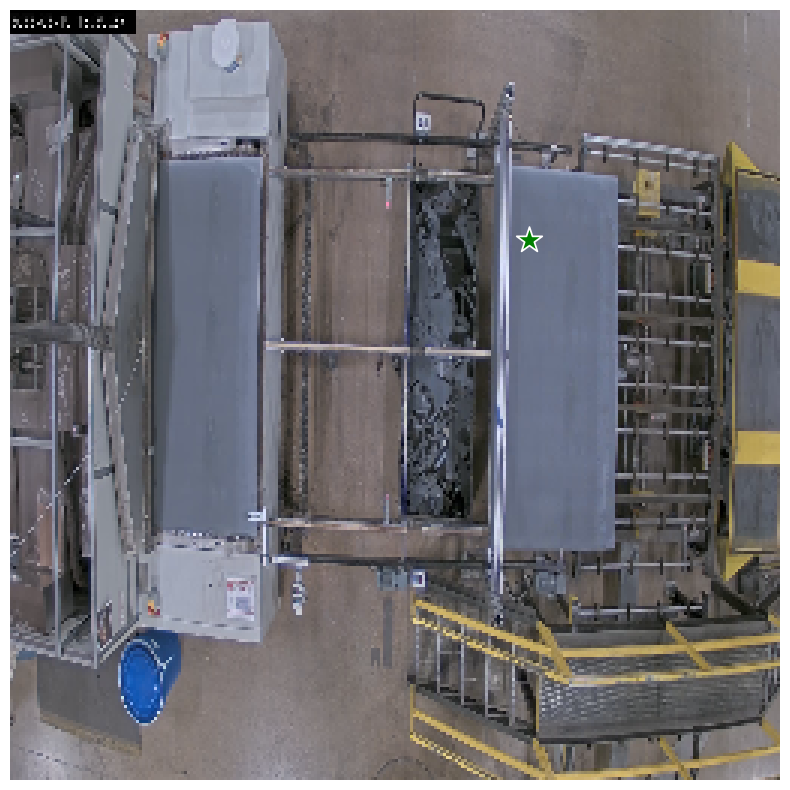

In [100]:
# 52, 52
# 172, 76
point1 = np.array([[172, 76]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [101]:
len(image)

256

In [102]:
image.shape

(256, 256, 3)

In [103]:
256*256

65536

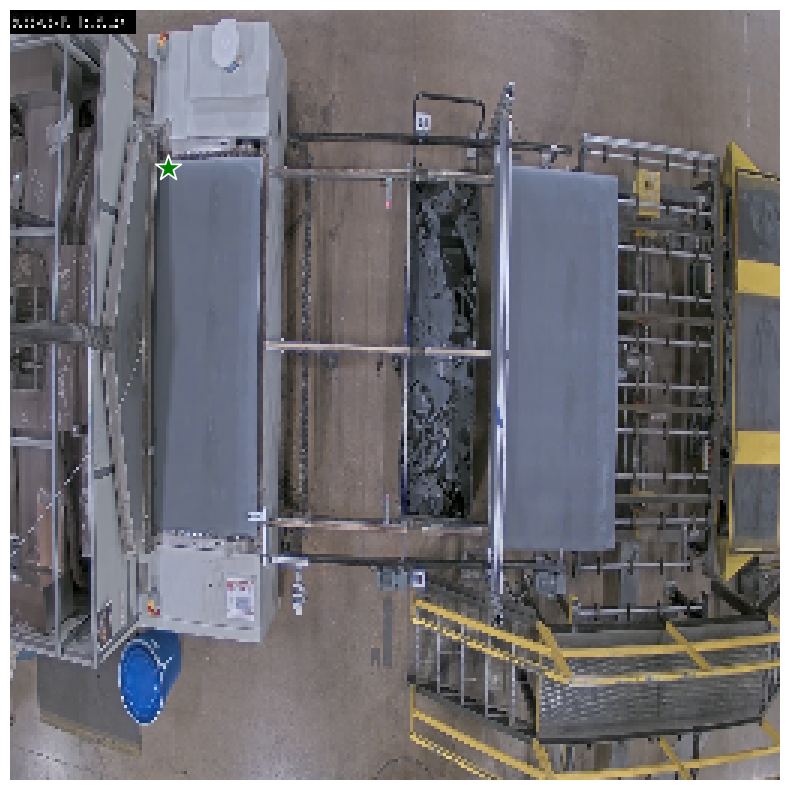

In [104]:
# 52, 52
# 172, 76
point1 = np.array([[52, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

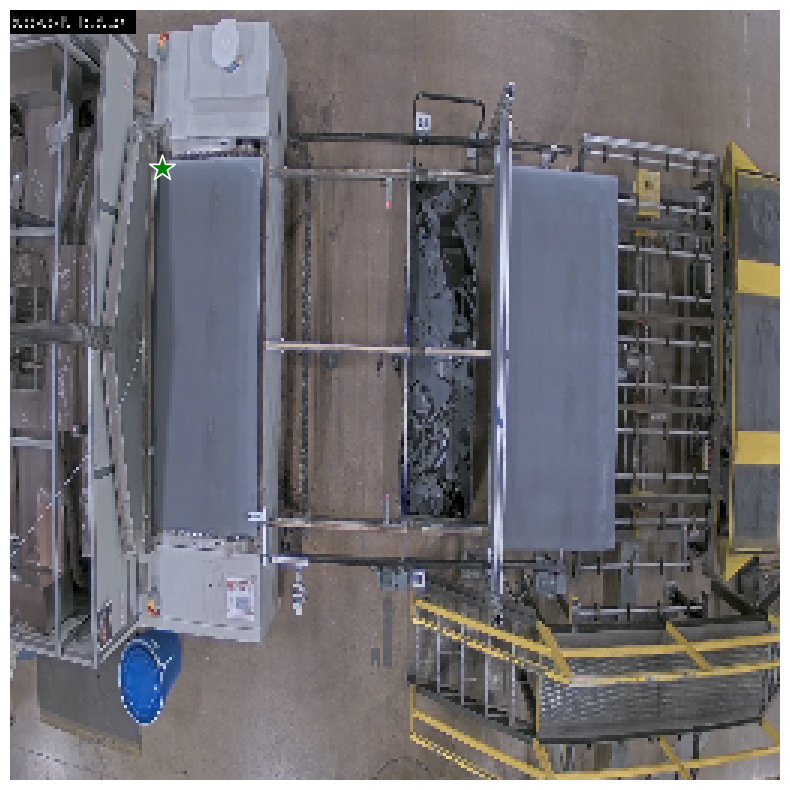

In [105]:
# 52, 52
# 172, 76
point1 = np.array([[50, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

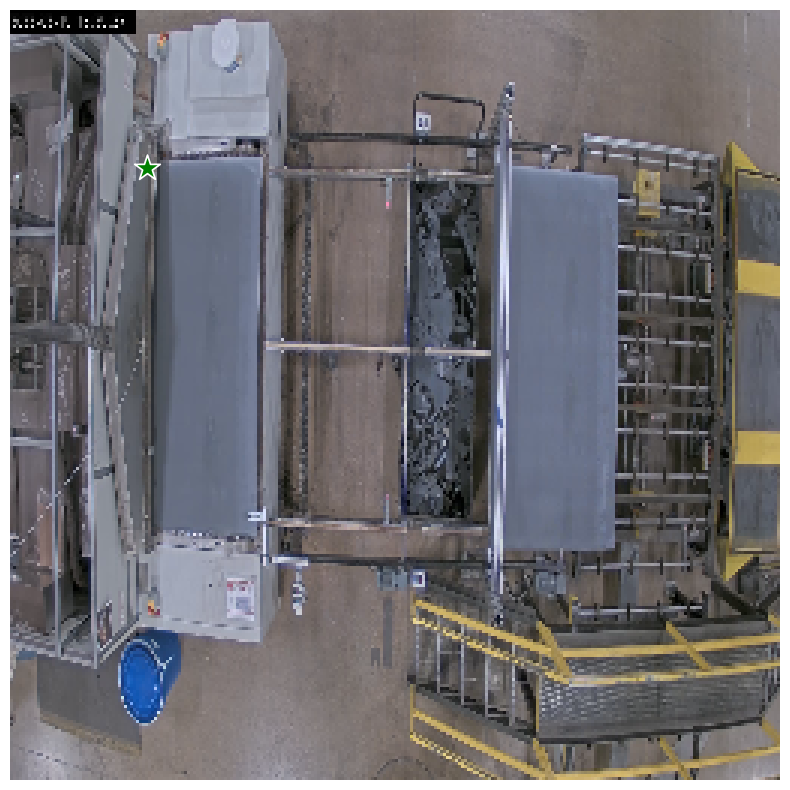

In [106]:
# 52, 52
# 172, 76
point1 = np.array([[45, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [107]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=20):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

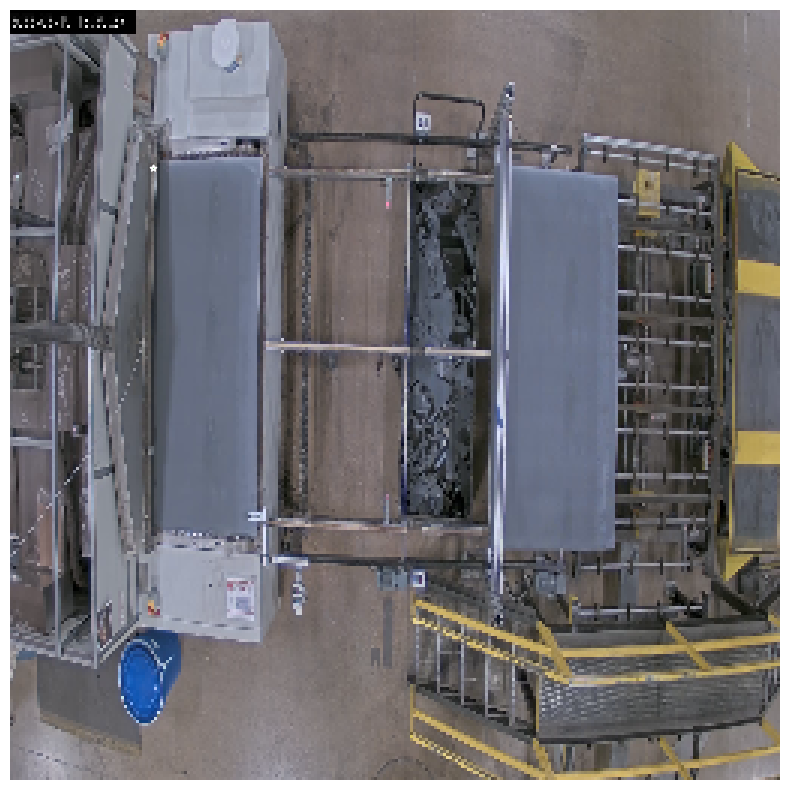

In [108]:
# 52, 52
# 172, 76
point1 = np.array([[47, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

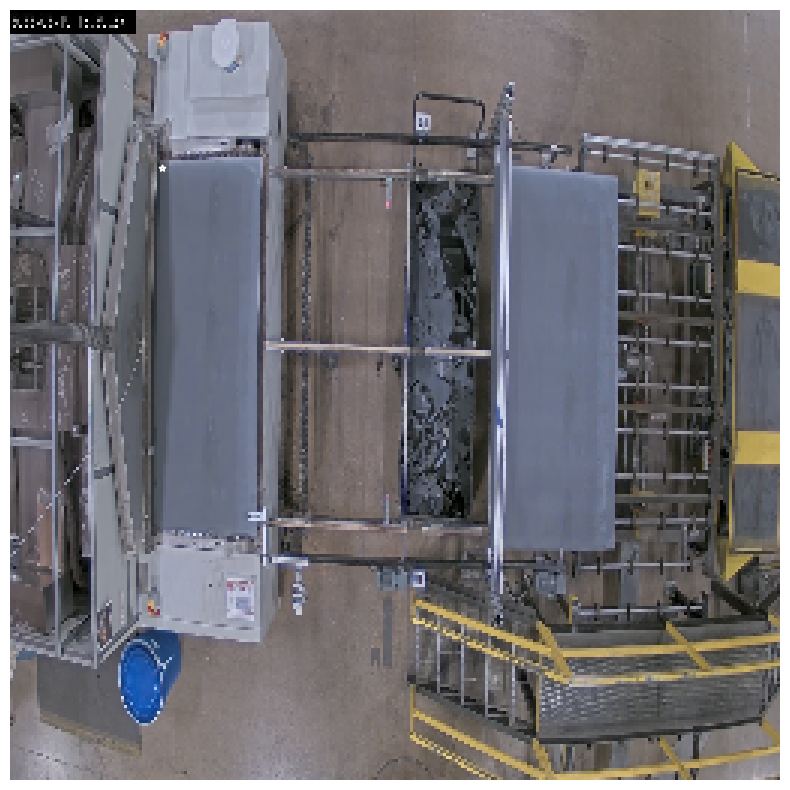

In [109]:
# 52, 52
# 172, 76
point1 = np.array([[50, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

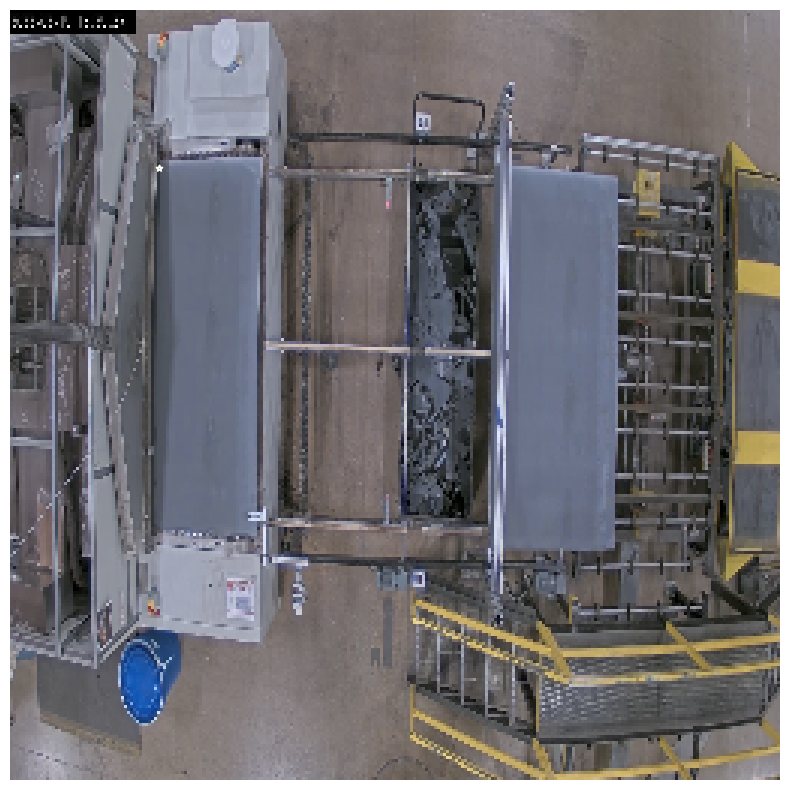

In [110]:
# 52, 52
# 172, 76
point1 = np.array([[49, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

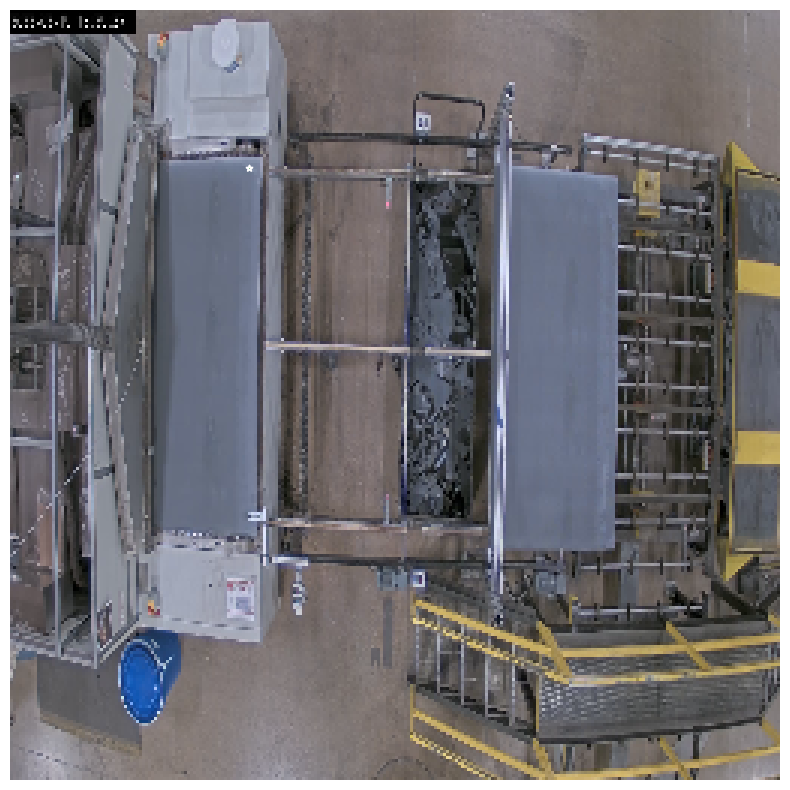

In [111]:
# 52, 52
# 172, 76
# Solar panel dim: 
point1 = np.array([[79, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

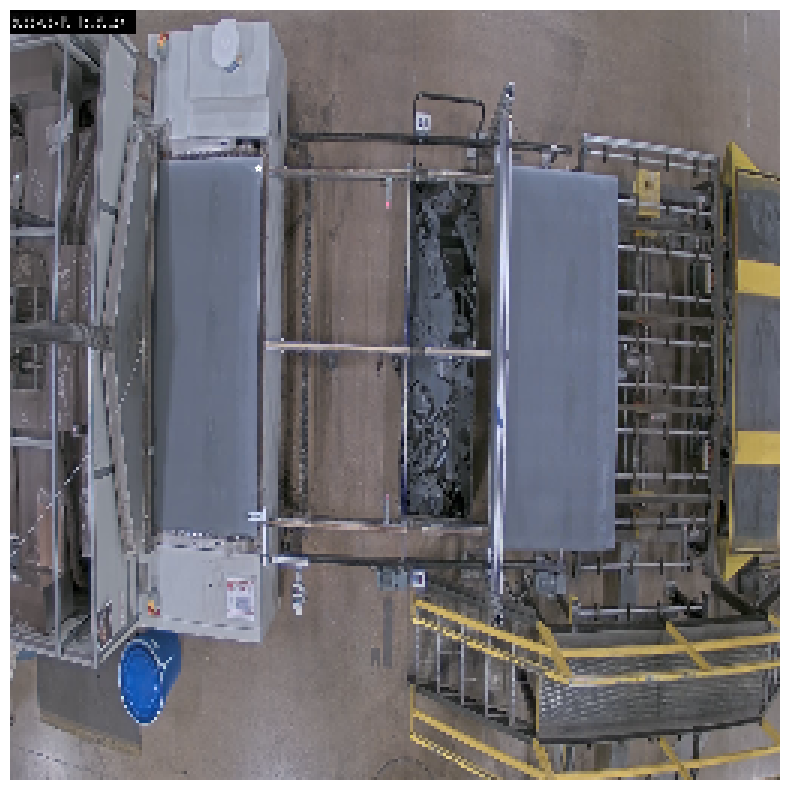

In [112]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 
point1 = np.array([[82, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

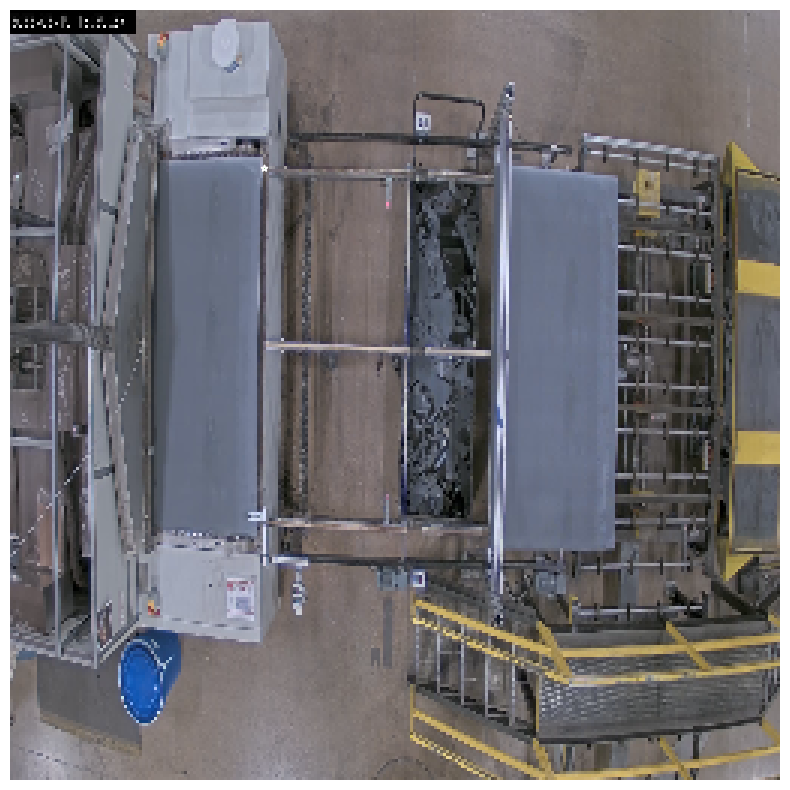

In [113]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 
point1 = np.array([[84, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

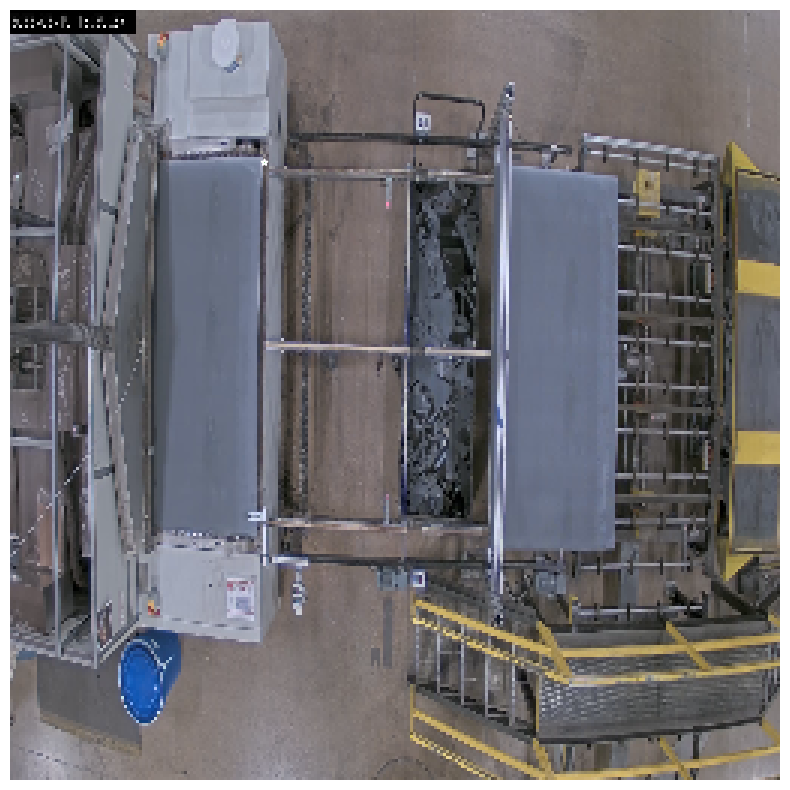

In [114]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 
point1 = np.array([[84, 50]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

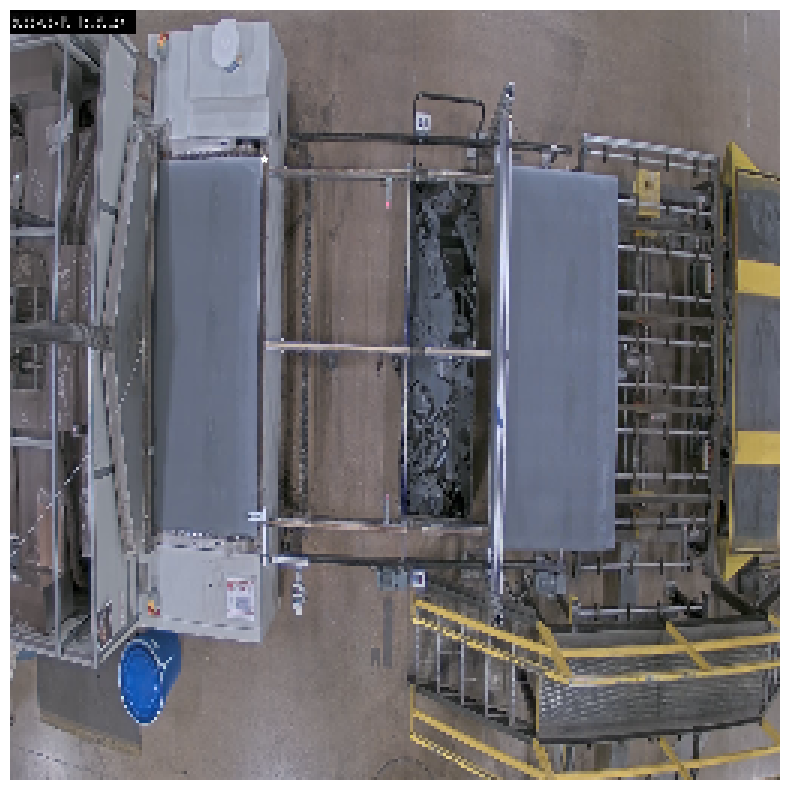

In [115]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 
point1 = np.array([[84, 49]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

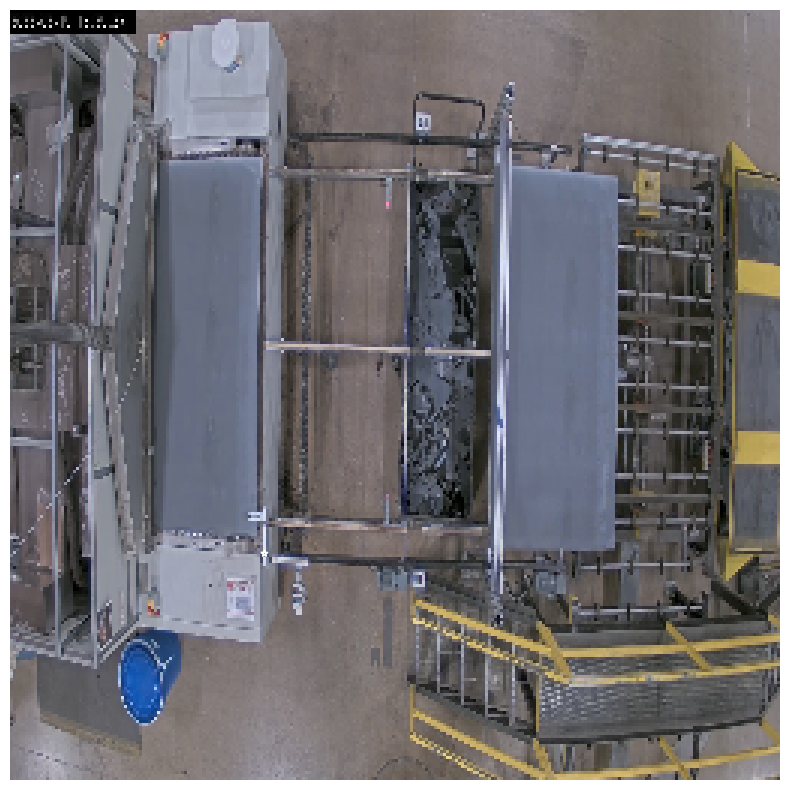

In [116]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 49 - 
point1 = np.array([[84, 180]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

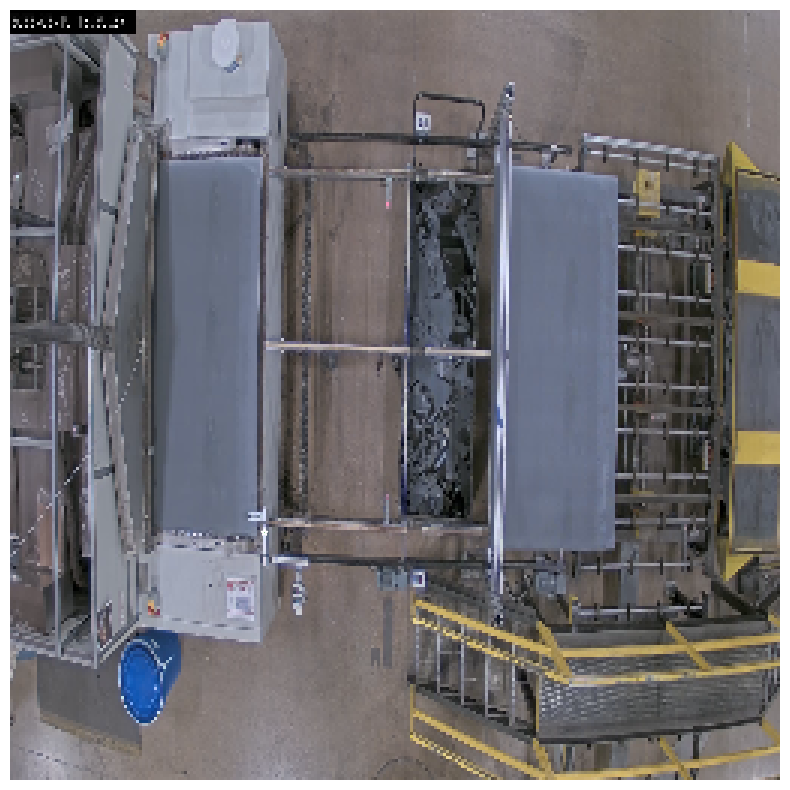

In [117]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 49 - 
point1 = np.array([[84, 173]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

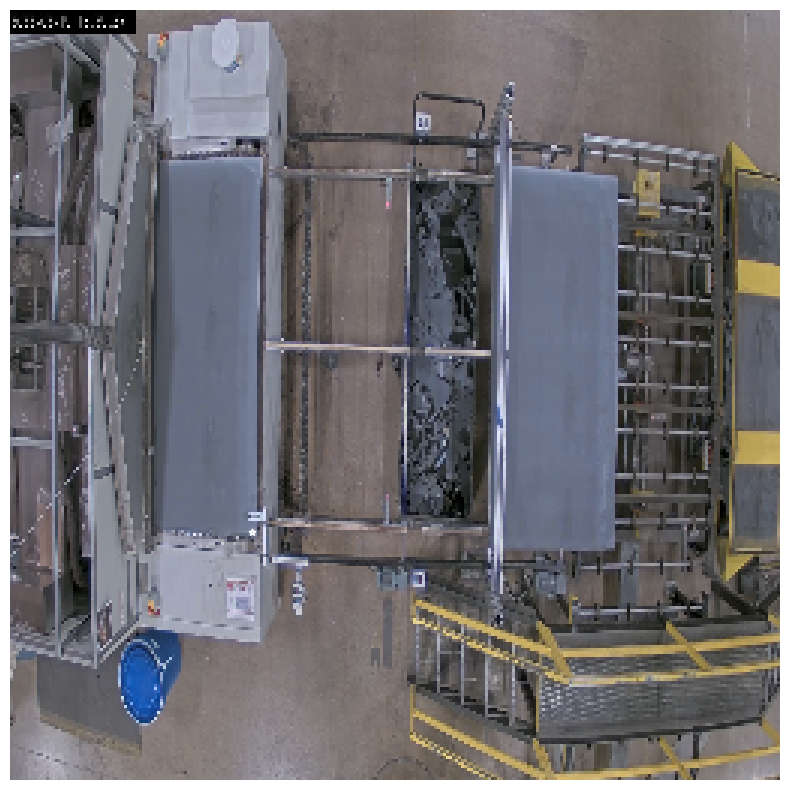

In [118]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 49 - 
point1 = np.array([[80, 173]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [119]:
173-49

124

In [120]:
83-49

34

In [121]:
34*124

4216

In [122]:
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=4000)
#SAM_assisted generating
masks = mask_generator.generate(image)
print(len(masks))
# Area = 80000 - 1
# Total area of the image: 65536
# Solar panel area: 5474

86


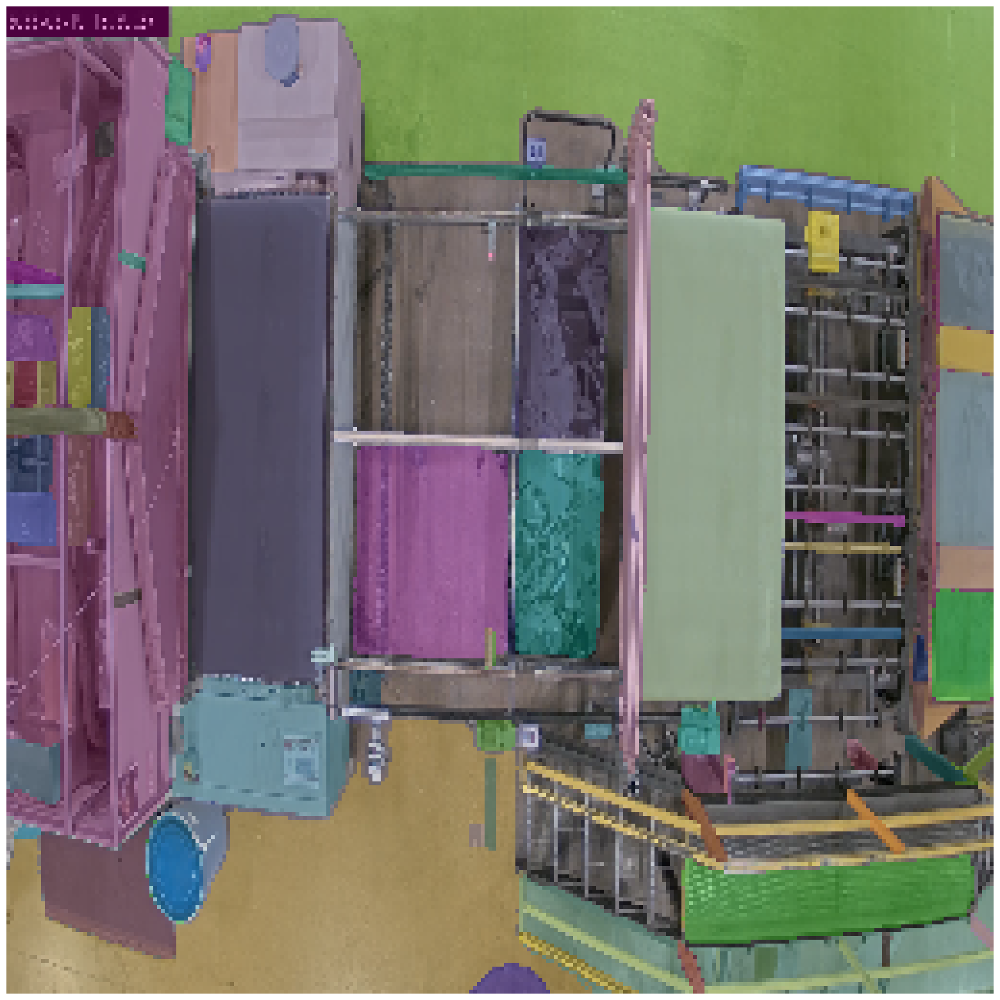

In [123]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [124]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 4510,
  'bbox': [165, 52, 36, 127],
  'predicted_iou': 0.9984180331230164,
  'point_coords': [[172.0, 60.0]],
  'stability_score': 0.9839560389518738,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 5474,
  'bbox': [159, 24, 42, 172],


In [125]:
a = masks[0]

In [126]:
a['area']

4510

In [127]:
a

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4510,
 'bbox': [165, 52, 36, 127],
 'predicted_iou': 0.9984180331230164,
 'point_coords': [[172.0, 60.0]],
 'stability_score': 0.9839560389518738,
 'crop_box': [0, 0, 256, 256]}

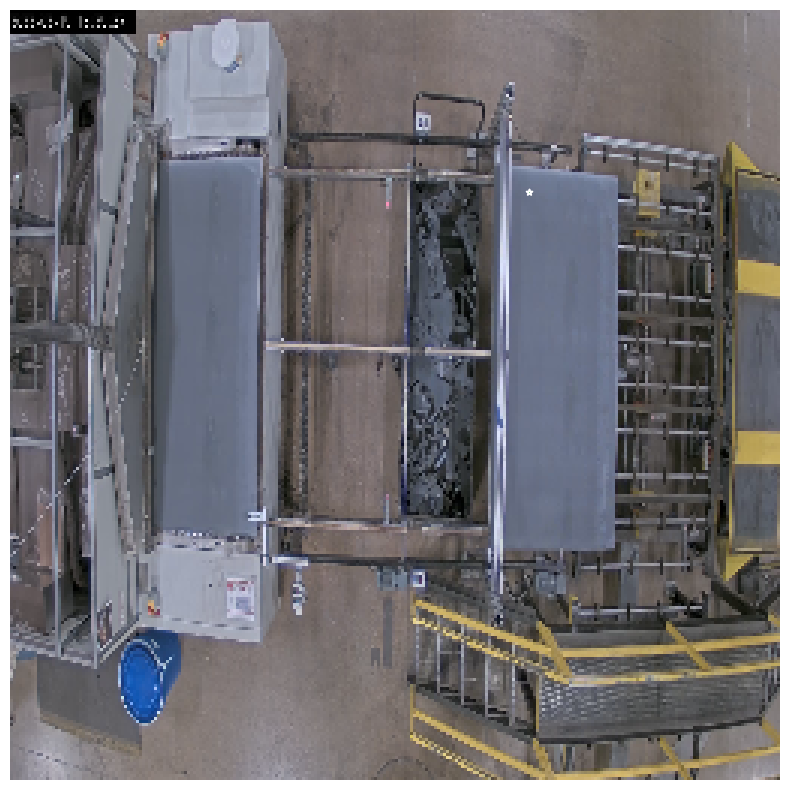

In [128]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[172, 60]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [129]:
min_area = 4000
max_area = 4600
index = []
for idx, mask in enumerate(masks):
    if mask['area'] > min_area and mask['area'] < max_area:
        index.append(idx)

In [130]:
index

[0, 2]

In [131]:
masks[2]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4322,
 'bbox': [48, 49, 35, 125],
 'predicted_iou': 0.9912318587303162,
 'point_coords': [[52.0, 52.0]],
 'stability_score': 0.9796198606491089,
 'crop_box': [0, 0, 256, 256]}

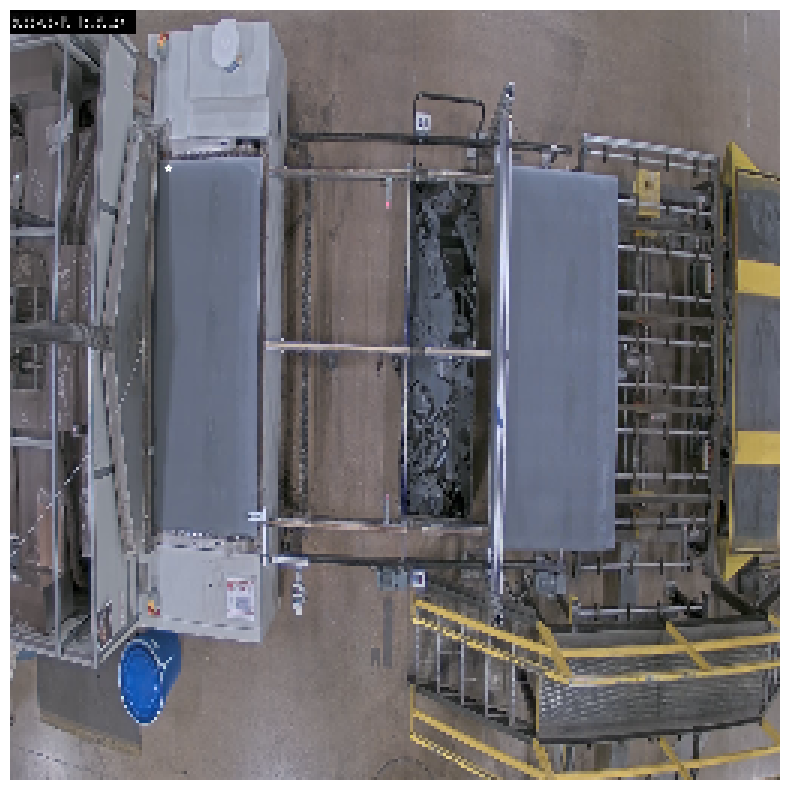

In [132]:
# 52, 52
# 172, 76
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[52, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [133]:
panel_mask = masks[index]

TypeError: list indices must be integers or slices, not list

In [134]:
panel_mask = masks[index]


TypeError: list indices must be integers or slices, not list

In [135]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 4510,
  'bbox': [165, 52, 36, 127],
  'predicted_iou': 0.9984180331230164,
  'point_coords': [[172.0, 60.0]],
  'stability_score': 0.9839560389518738,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 5474,
  'bbox': [159, 24, 42, 172],


In [136]:
index|

SyntaxError: invalid syntax (<ipython-input-136-f3138f2803fe>, line 1)

In [137]:
index

[0, 2]

In [138]:
masks[0, 1]

TypeError: list indices must be integers or slices, not tuple

In [139]:
masks[0]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 4510,
 'bbox': [165, 52, 36, 127],
 'predicted_iou': 0.9984180331230164,
 'point_coords': [[172.0, 60.0]],
 'stability_score': 0.9839560389518738,
 'crop_box': [0, 0, 256, 256]}

In [140]:
panel_mask = [masks[i] for i in index]

In [141]:
panel_mask

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 4510,
  'bbox': [165, 52, 36, 127],
  'predicted_iou': 0.9984180331230164,
  'point_coords': [[172.0, 60.0]],
  'stability_score': 0.9839560389518738,
  'crop_box': [0, 0, 256, 256]},
 {'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 4322,
  'bbox': [48, 49, 35, 125],
 

In [142]:
a = panel_mask[0]

In [143]:
a['segmentation']

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [144]:
seg = a['segmentation']

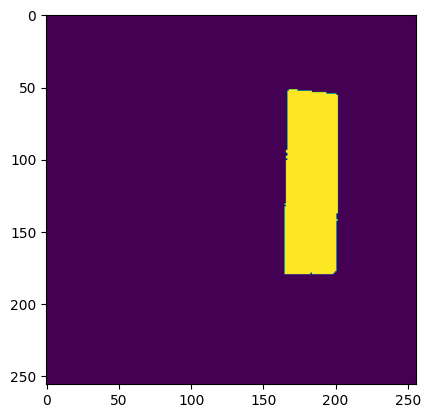

In [145]:
plt.imshow(seg)

In [146]:
seg.shape

(256, 256)

In [147]:
panel_mask = [masks[i] for i in index]
seg = 0
for mask in panel_mask:
    cur_seg = mask['segmentation']
    seg = seg + cur_seg

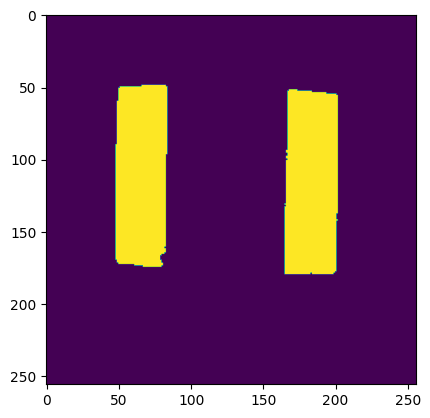

In [148]:
plt.imshow(seg)

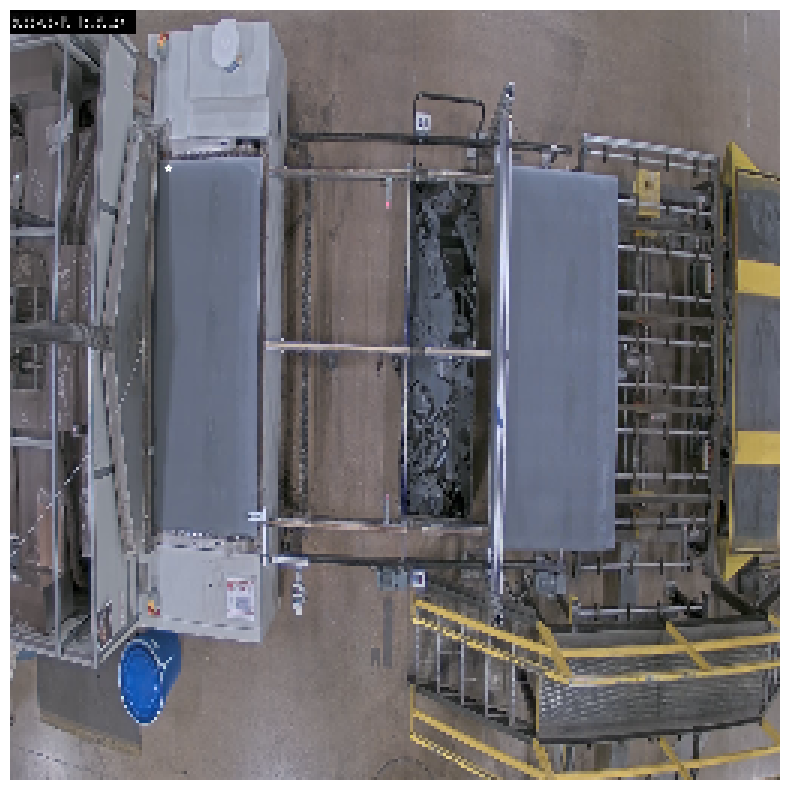

In [149]:
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[52, 52]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [150]:
cur_seg = mask['segmentation']

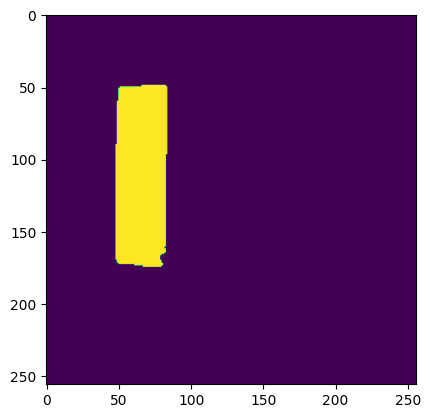

In [151]:
plt.imshow(cur_seg)

In [152]:
cur_seg.shape

(256, 256)

In [153]:
cur_seg

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [154]:
temp = np.array(cur_seg)

In [155]:
temp

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [156]:
temp = int(np.array(cur_seg))

TypeError: only length-1 arrays can be converted to Python scalars

In [157]:
int(cur_seg)

TypeError: only length-1 arrays can be converted to Python scalars

In [158]:
cur_seg * 1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [159]:
temp = cur_seg * 1

In [160]:
temp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [161]:
temp == 1

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [162]:
temp.shape

(256, 256)

In [163]:
temp == 1

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [164]:
np.where(temp == 1)

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

In [165]:
temp = cur_seg * 1
truth = np.where(temp == 1)

In [166]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

In [167]:
truth.shape

AttributeError: 'tuple' object has no attribute 'shape'

In [168]:
truth[0]

array([ 49,  49,  49, ..., 174, 174, 174])

In [169]:
truth[1]

array([66, 67, 68, ..., 77, 78, 79])

In [170]:
temp = cur_seg * 1
truth = np.where(temp == 1)
topleft_x = truth[0][0]
topleft_y = truth[1][0]
botright_x = truth[0][-1]
botright_y = truth[1][-1]

In [171]:
topleft_x

49

In [172]:
topleft_y

66

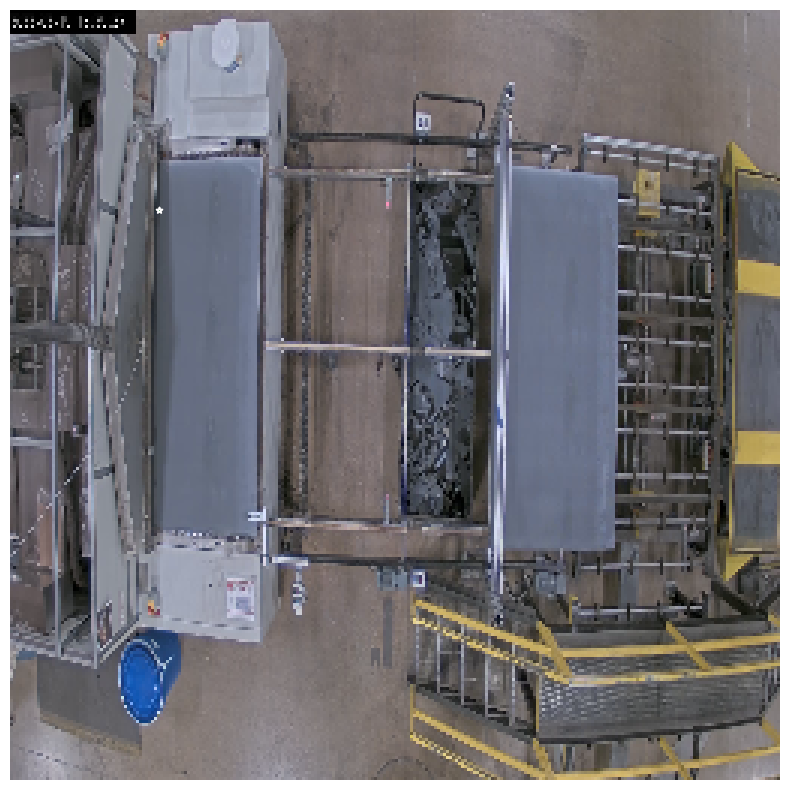

In [173]:
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[49, 66]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

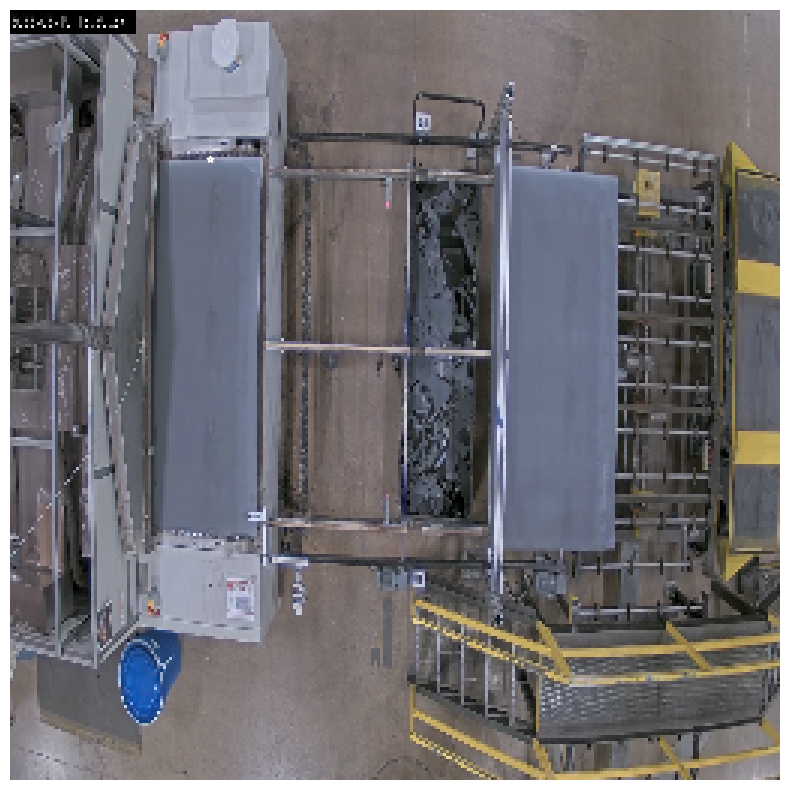

In [174]:
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[66, 49]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [175]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

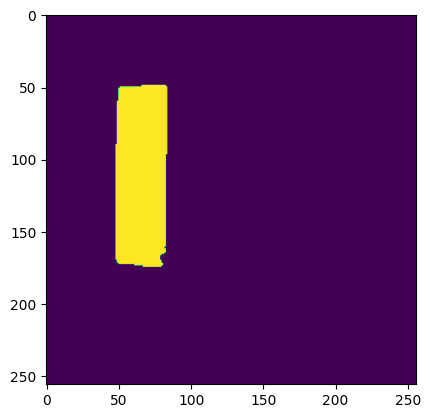

In [176]:
plt.imshow(temp)

In [177]:
topleft_x

49

In [178]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

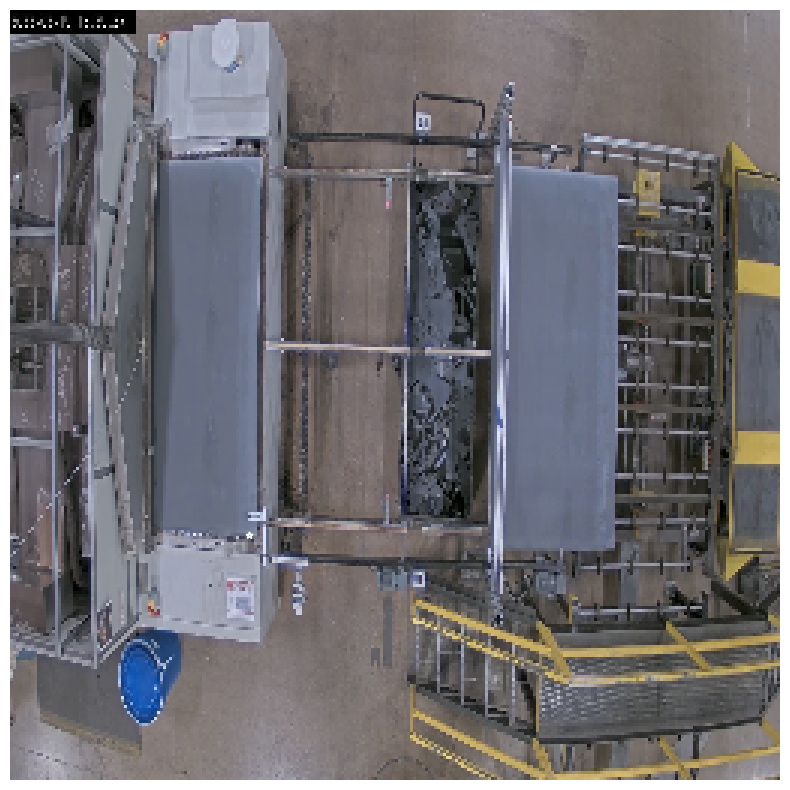

In [179]:
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[79, 174]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [180]:
temp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [181]:
temp[49, 49]

0

In [182]:
temp[50, 50]

0

In [183]:
temp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [184]:
with open("output.txt", "w") as txt_file:
    for line in temp:
        txt_file.write(" ".join(line) + "\n") # works with any number of elements in a line

TypeError: sequence item 0: expected str instance, numpy.int64 found

In [185]:
np.savetxt('myarray.txt', temp)

In [186]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

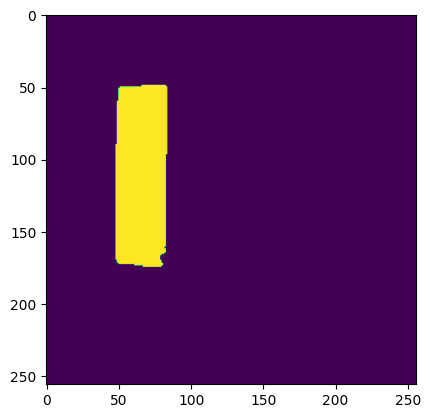

In [187]:
plt.imshow(cur_seg)

In [188]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

In [189]:
temp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [190]:
temp[60, 60]

1

In [191]:
truth = np.where(temp == 1)

In [192]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

In [193]:
truth[0]

array([ 49,  49,  49, ..., 174, 174, 174])

In [194]:
truth[1]

array([66, 67, 68, ..., 77, 78, 79])

In [195]:
truth[1].shape

(4322,)

In [196]:
truth[0].shape

(4322,)

In [197]:
temp[49, 66]

1

In [198]:
temp[49, 60]

0

In [199]:
temp[49, 79]

1

In [200]:
truth

(array([ 49,  49,  49, ..., 174, 174, 174]),
 array([66, 67, 68, ..., 77, 78, 79]))

In [201]:
temp = cur_seg * 1
truth = np.where(temp == 1)
min_y = np.min(truth[0])
max_y = np.max(truth[0])
min_x = np.min(truth[1])
max_x = np.max(truth[1])

In [202]:
min_x

48

In [203]:
temp[1:10, 1:10]

array([[0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [204]:
temp[1:10, 1:10] = 1

In [205]:
temp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [206]:
temp = cur_seg * 1
truth = np.where(temp == 1)
min_y = np.min(truth[0])
max_y = np.max(truth[0])
min_x = np.min(truth[1])
max_x = np.max(truth[1])

temp[min_y:max_y, min_x:max_x] = 1

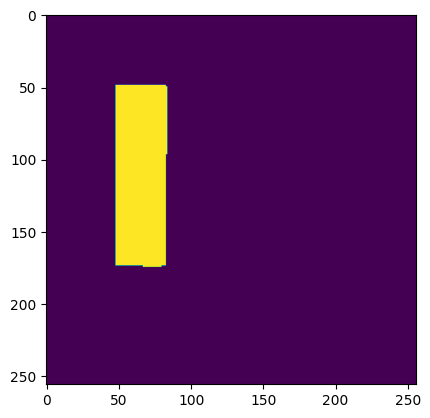

In [207]:
plt.imshow(temp)

In [208]:
temp = cur_seg * 1
truth = np.where(temp == 1)
min_y = np.min(truth[0])
max_y = np.max(truth[0])
min_x = np.min(truth[1])
max_x = np.max(truth[1])

temp[min_y:(max_y+1), min_x:(max_x+1)] = 1

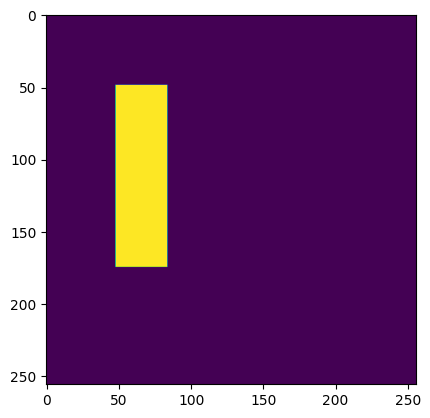

In [209]:
plt.imshow(temp)

In [210]:
panel_mask = [masks[i] for i in index]
seg = 0
for mask in panel_mask:
    cur_seg = mask['segmentation']
    temp = cur_seg * 1
    truth = np.where(temp == 1)
    min_y = np.min(truth[0])
    max_y = np.max(truth[0])
    min_x = np.min(truth[1])
    max_x = np.max(truth[1])
    temp[min_y:(max_y+1), min_x:(max_x+1)] = 1
    seg = seg + temp

In [211]:
seg

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

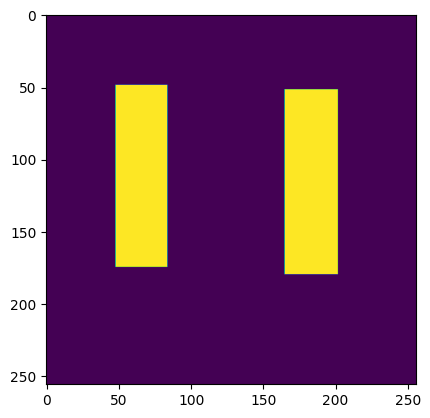

In [212]:
plt.imshow(seg)

In [213]:
import torch
from PIL import Image
import requests
from transformers import SamModel, SamProcessor, SamImageProcessor, AutoProcessor
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry
from huggingface_hub import hf_hub_download 
from PIL import Image 
from torch import nn 
from torch.optim import AdamW 
from torch.optim.lr_scheduler import CosineAnnealingLR 
import torch.nn.functional as F 
from torchvision.transforms.functional import resize, to_pil_image 
from typing import Tuple 
device = "cuda:1" if torch.cuda.is_available() else "cpu" 

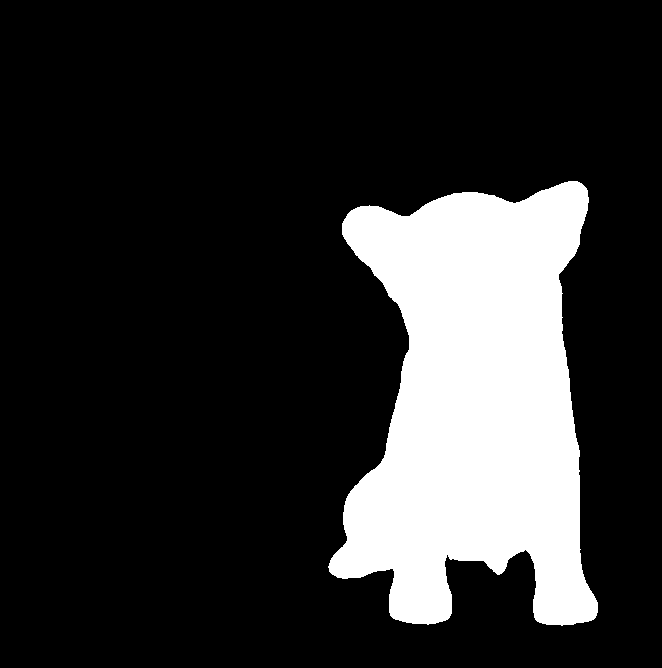

In [214]:
processor = AutoProcessor.from_pretrained("facebook/sam-vit-huge") 
model = SamModel.from_pretrained("facebook/sam-vit-huge")

# Load reference images
filename = hf_hub_download(repo_id="nielsr/persam-dog", filename="dog.jpg", repo_type="dataset") 
ref_image = Image.open(filename).convert("RGB") 
#ref_image
# Load reference mask
filename = hf_hub_download(repo_id="nielsr/persam-dog", filename="dog_mask.png", repo_type="dataset") 
# Image.open(filename).convert("RGB") mask
ref_mask = cv2.imread(filename) 
ref_mask = cv2.cvtColor(ref_mask, cv2.COLOR_BGR2RGB) 
gt_mask = torch.tensor(ref_mask)[:, :, 0] > 0 
gt_mask = gt_mask.float().unsqueeze(0).flatten(1) 
# Look at the reference mask
visual_mask = ref_mask.astype(np.uint8) 
Image.fromarray(visual_mask)

In [215]:
ref_mask

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

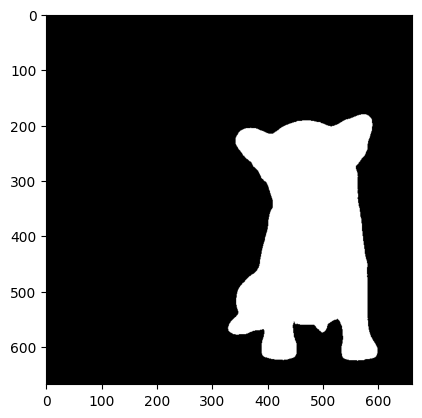

In [216]:
plt.imshow(ref_mask)

In [217]:
ref_mask.shape

(668, 662, 3)

In [218]:
aaa = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB) 

error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<1>; VDcn = cv::impl::{anonymous}::Set<3, 4>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 4 (CV_32S)


In [219]:
gt_mask.shape

torch.Size([1, 442216])

In [220]:
seg

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

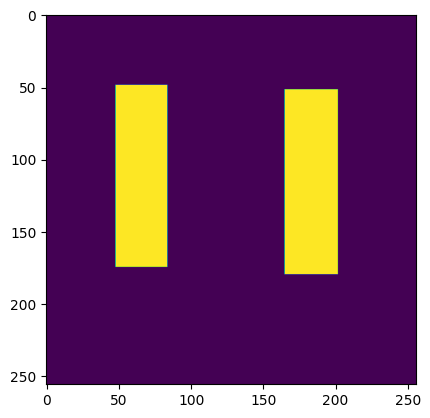

In [221]:
plt.imshow(seg)

In [222]:
np.array((20,20,3))

array([20, 20,  3])

In [223]:
np.ones((2,2,3))

array([[[1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.]]])

In [224]:
panel_mask = [masks[i] for i in index]
seg = np.zeros((256, 256, 3))
for mask in panel_mask:
    cur_seg = mask['segmentation']
    temp = cur_seg * 1
    truth = np.where(temp == 1)
    min_y = np.min(truth[0])
    max_y = np.max(truth[0])
    min_x = np.min(truth[1])
    max_x = np.max(truth[1])
    seg[min_y:(max_y+1), min_x:(max_x+1)] = 1
    #seg = seg + temp

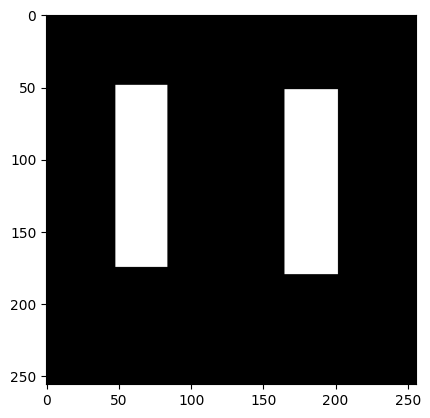

In [225]:
plt.imshow(seg)

In [226]:
range(1,12)

range(1, 12)

In [227]:
image_number = range(1,10)
for i in image_number:
    filepath = wk_dir + "Data/SolarPanel/Frame_00" + i + ".png"
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

TypeError: can only concatenate str (not "int") to str

In [228]:
image_number = range(1,10)
for i in image_number:
    filepath = wk_dir + "Data/SolarPanel/Frame_00" + str(i) + ".png"
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [229]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import sys
import os
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

wk_dir = "/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/"

In [230]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=20):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [231]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=4000)

In [232]:
image_number = range(1,10)
for i in image_number:
    filepath = wk_dir + "Data/SolarPanel/Frame_00" + str(i) + ".png"
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Generate masks
    masks = mask_generator.generate(image)
    # Search solar panels
    min_area = 4000
    max_area = 4600
    index = []
    for idx, mask in enumerate(masks):
        if mask['area'] > min_area and mask['area'] < max_area:
            index.append(idx)

In [233]:
#SAM_assisted generating
# Area = 80000 - 1
# Total area of the image: 65536
# Solar panel area: 5474

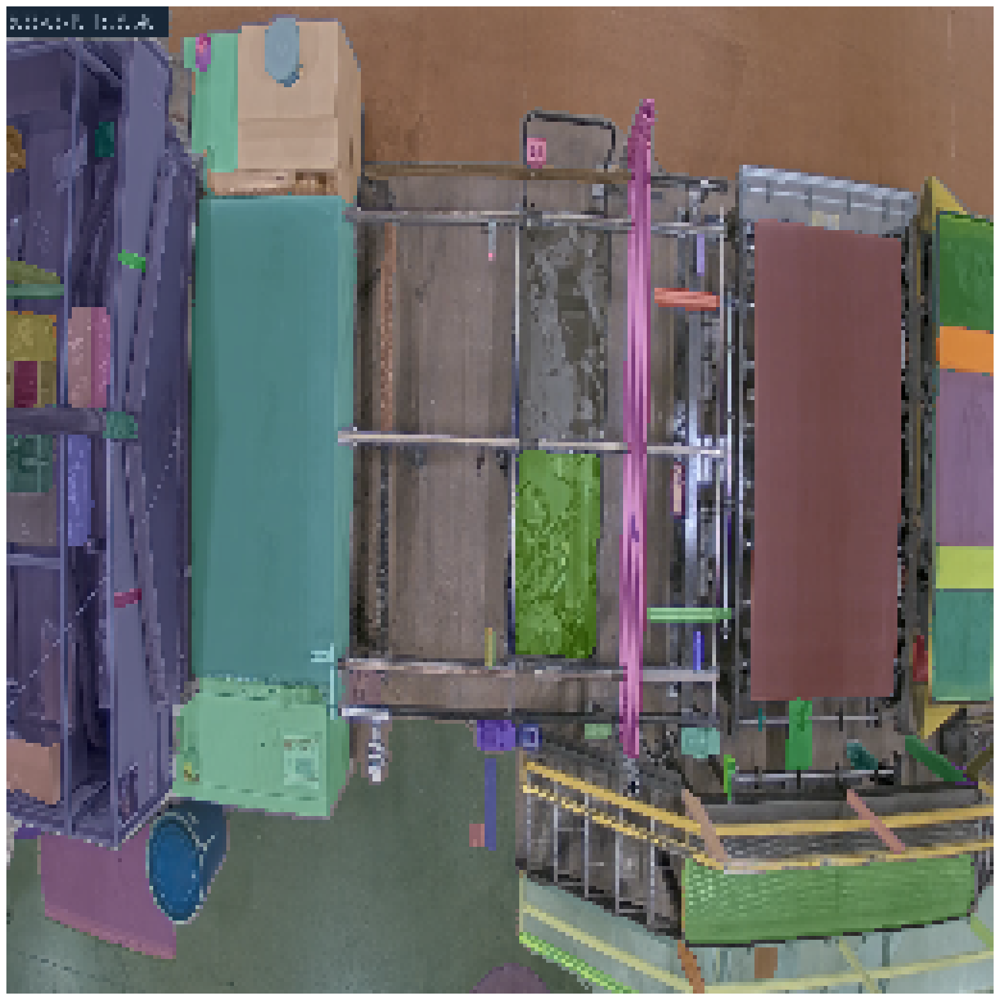

In [234]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

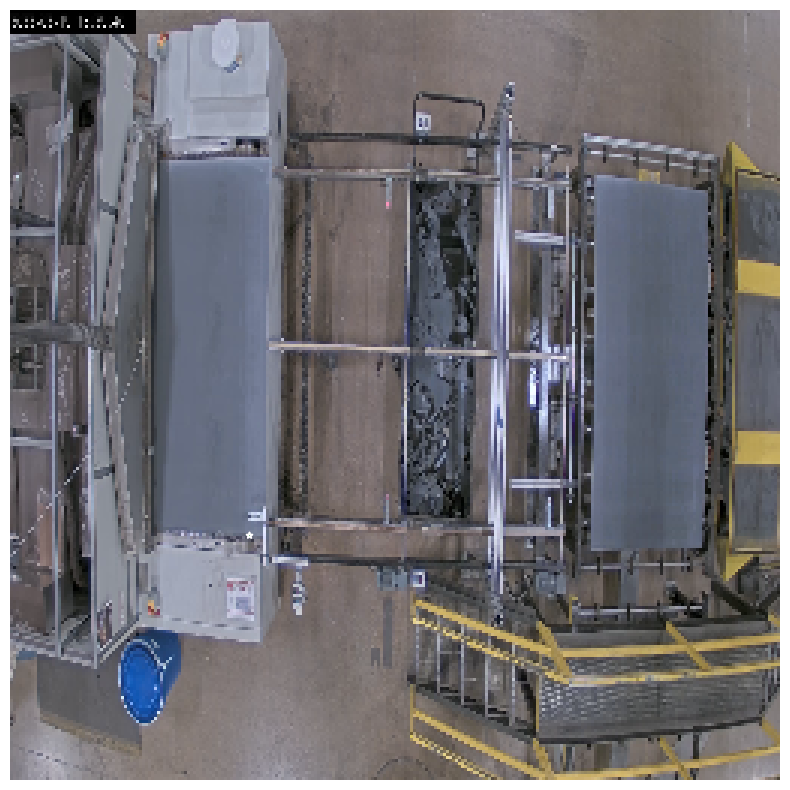

In [235]:
# Solar panel dim: 49 - 83; 49 - 173
# Solar panel area: 4216
point1 = np.array([[79, 174]])
label = np.array([1])
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(point1, label, plt.gca())
plt.axis('off')
plt.show()

In [236]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import sys
import os
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

wk_dir = "/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/"

In [237]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=20):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [238]:
os.chdir(wk_dir)
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=20):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    
    
# Calculate the Intersection over Union (IoU) score between two masks.
# Mask: n*m*3 matrix with the mask parts being 128.
def calculate_iou(mask1, mask2):
    mask1 = mask1.sum(axis=2)
    mask2 = mask2.sum(axis=2)

    mask1 = np.where(mask1 == 128, 1, 0)
    mask2 = np.where(mask2 == 128, 1, 0)
    intersection = np.sum(np.logical_and(mask1, mask2))
    union = np.sum(np.logical_or(mask1, mask2))
    iou = intersection / union
    return iou

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [239]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda:1" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
mask_generator = SamAutomaticMaskGenerator(model = sam, 
                                           min_mask_region_area=4000)

In [240]:
image_number = range(1,10)
for i in image_number:
    image_names = "Frame_00" + str(i) + ".png"
    filepath = wk_dir + "Data/SolarPanel/" + image_names
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Generate masks
    masks = mask_generator.generate(image)
    # Search solar panels
    min_area = 4000
    max_area = 4600
    index = []
    for idx, mask in enumerate(masks):
        if mask['area'] > min_area and mask['area'] < max_area:
            index.append(idx)
    # Get masks
    panel_mask = [masks[i] for i in index]
    seg = np.zeros((256, 256, 3))
    for mask in panel_mask:
        cur_seg = mask['segmentation']
        temp = cur_seg * 1
        truth = np.where(temp == 1)
        min_y = np.min(truth[0])
        max_y = np.max(truth[0])
        min_x = np.min(truth[1])
        max_x = np.max(truth[1])
        seg[min_y:(max_y+1), min_x:(max_x+1)] = 1
        #seg = seg + temp
    cv2.imwrite(seg, wk_dir + "/Labels/SolarPanel" + image_names)

error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'imwrite'
> Overload resolution failed:
>  - Can't convert object to 'str' for 'filename'
>  - Can't convert object to 'str' for 'filename'


In [241]:
i = 1

In [242]:
image_names = "Frame_00" + str(i) + ".png"

In [243]:
filepath = wk_dir + "Data/SolarPanel/" + image_names

In [244]:
filepath

'/r/bb04na2a.unx.sas.com/vol/bigdisk/lax/hoyang/FineTune/Data/SolarPanel/Frame_001.png'

In [245]:
image = cv2.imread(filepath)

In [246]:
seg

array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       ...,

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]])

In [247]:
seg.shape

(256, 256, 3)

In [248]:
cv2.imwrite(seg, wk_dir + "/Labels/SolarPanel" + image_names)

error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'imwrite'
> Overload resolution failed:
>  - Can't convert object to 'str' for 'filename'
>  - Can't convert object to 'str' for 'filename'


In [249]:
image_number = range(1,10)
for i in image_number:
    image_names = "Frame_00" + str(i) + ".png"
    filepath = wk_dir + "Data/SolarPanel/" + image_names
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Generate masks
    masks = mask_generator.generate(image)
    # Search solar panels
    min_area = 4000
    max_area = 4600
    index = []
    for idx, mask in enumerate(masks):
        if mask['area'] > min_area and mask['area'] < max_area:
            index.append(idx)
    # Get masks
    panel_mask = [masks[i] for i in index]
    seg = np.zeros((256, 256, 3))
    for mask in panel_mask:
        cur_seg = mask['segmentation']
        temp = cur_seg * 1
        truth = np.where(temp == 1)
        min_y = np.min(truth[0])
        max_y = np.max(truth[0])
        min_x = np.min(truth[1])
        max_x = np.max(truth[1])
        seg[min_y:(max_y+1), min_x:(max_x+1)] = 1
        #seg = seg + temp
    cv2.imwrite(wk_dir + "/Labels/SolarPanel" + image_names, seg)

In [250]:
seg.shape

(256, 256, 3)

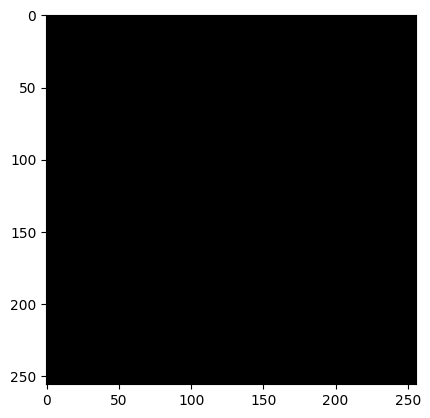

In [251]:
plt.imshow(seg)

KeyboardInterrupt: 

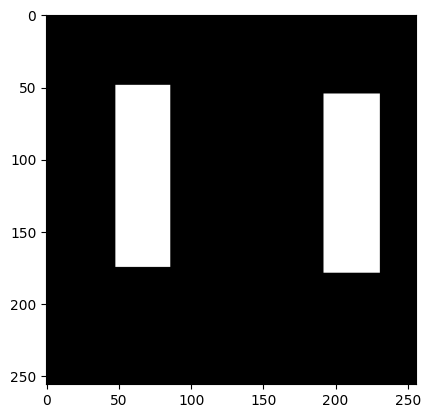

In [252]:
image_number = range(1,10)
for i in image_number:
    image_names = "Frame_00" + str(i) + ".png"
    filepath = wk_dir + "Data/SolarPanel/" + image_names
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Generate masks
    masks = mask_generator.generate(image)
    # Search solar panels
    min_area = 4000
    max_area = 4600
    index = []
    for idx, mask in enumerate(masks):
        if mask['area'] > min_area and mask['area'] < max_area:
            index.append(idx)
    # Get masks
    panel_mask = [masks[i] for i in index]
    seg = np.zeros((256, 256, 3))
    for mask in panel_mask:
        cur_seg = mask['segmentation']
        temp = cur_seg * 1
        truth = np.where(temp == 1)
        min_y = np.min(truth[0])
        max_y = np.max(truth[0])
        min_x = np.min(truth[1])
        max_x = np.max(truth[1])
        seg[min_y:(max_y+1), min_x:(max_x+1)] = 1
        #seg = seg + temp
    plt.imshow(seg)
    cv2.imwrite(wk_dir + "/Labels/SolarPanel/" + image_names, seg)

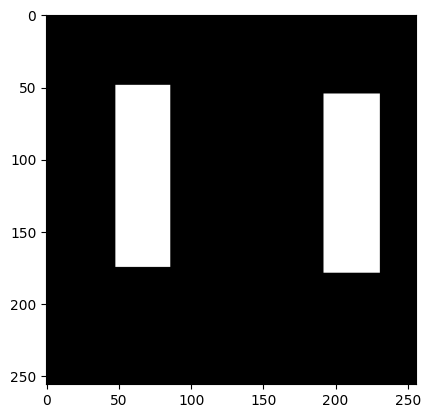

In [253]:
plt.imshow(seg)

In [254]:
i

7

In [255]:
cv2.imwrite(wk_dir + "/Labels/SolarPanel/" + image_names, seg)

True

In [256]:
test = cv2.imread(wk_dir + "/Labels/SolarPanel/" + image_names)

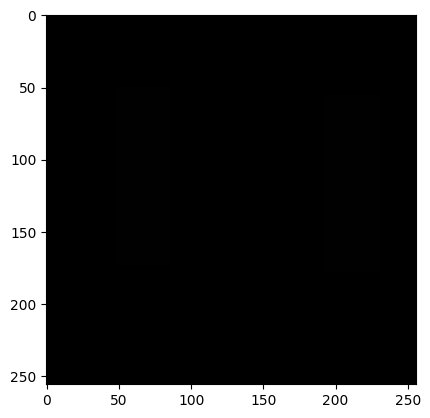

In [257]:
plt.imshow(test)